# Library

In [39]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)

# Auto reload of library
%reload_ext autoreload
%autoreload 2

from import_KK import *
# DeviceStrategy_CPU()
DeviceStrategy_GPU()
from preprocessing_KK import *
from preprocessing_project_KK import *
from description_KK import *
from algorithm_machinelearning_KK import *
from algorithm_deeplearning_KK import *
from evaluation_KK import *
from visualization_KK import *


=========== GPU Strategy ===========
Detected GPUs:
 [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Only 1 GPU detected. Using single-GPU strategy.


======= GPU / CUDA / STATUS ========
Cuda Ready?        True
CUDA Version:      12.5.1
cuDNN Version:     9

TF Version:        2.20.0
Keras Version:     3.13.0
True
Torch Version:       2.8.0+cu128
Torch CUDA Version:  12.8
Torch cuDNN Version: 91002

Torch GPUs Available: 1
Use the GPU: NVIDIA GeForce RTX 4070 Laptop GPU



# Hyperparameters

In [2]:
# Data
FOLDER_GDM, FOLDER_GDS = get_google_drivelocation(gdrive='z', glocation=os.path.join('Research', 'SavedData', 'MDIS-OldAdult'))
FOLDER_LOCATION = FOLDER_GDM
FILENAME = 'master_nontime_return_KK.csv'
FILE_LOCATION = os.path.join(FOLDER_LOCATION, FILENAME)
LANGUAGE = 'kr'

# Preprocessing
Y_colname = 'return'
X_reverse = None
X_nullmax = None
X_nullmin = None
X_dummy = None
X_encoding = None
X_delYrelated = None
X_del = None

TEST_SIZE = 'Time'
YEAR_VAL, YEAR_TEST = 1, 1 # Execute when TEST_SIZE = 'Time'
RANDOM_STATE = 123
CLASS_STAT = True
## 'RandomUnderSampler' <<< 'TomekLinks' << 'CondensedNearestNeighbour' < 'OneSidedSelection'
## 'SMOTE' <<< 'SMOTETomek' << 'BorderlineSMOTE' < 'ADASYN', 'auto'
# SAMPLING_METHOD = 'ADASYN'
SAMPLING_METHOD = 'auto'
## 'minority', 'not majority', 'not minority', 'all', 'auto'
SAMPLING_STRATEGY = 'auto'    # 'minority', 'not majority', 'not minority', 'all', 'auto'
SCALER = 'minmax'
LABEL_LIST = ['Negative', 'Positive']

# Model
## Common
TUNE_TRIALS_ML = 30
TUNE_TRIALS_DL = 10
CV_SPLITS = 5
## ML
TUNE_METRIC = 'F1-score' # Default('auto'): 'F1-score', 'RMSE' - 접두사 없어도 자동으로 validation set 기준으로 판단TUNE_METRIC = 'auto'
## DL
tf.random.set_seed(123)
NODE_MLP = [128, 256, 128, 64, 32, 10]
NODE_CNN = [32, 64, 128]
VALIDATION_SPLIT = 0.2
if VALIDATION_SPLIT != None:
    VALIDATION_DATA = None
BATCH_SIZE = 64
EPOCHS = 1000
VERBOSE = 0
TUNE_METRIC_DL = 'val_F1-score' # 'AUC', 'Accuracy', 'F1-score', 'loss', 'val_AUC', 'val_Accuracy', 'val_F1-score', 'val_loss'
## Final + XAI
METRIC_FINAL = "F1-score"
SHAP = True
INTERACTION = True
INTERACTION_SAMPLES = 2000
# FEATURE_PERTURBATION = 'tree_path_dependent'    # 'tree_path_dependent', 'interventional'
X_TOP_DISPLAY = 50

# Save
SAVE_NAME_PREDSTATTR = 'DescriptiveStatistics_BinaryPredTrain.csv'
SAVE_NAME_PREDSTATTE = 'DescriptiveStatistics_BinaryPredTest.csv'
SAVE_NAME_ML = 'Performance_ML'
SAVE_NAME_DL = 'Performance_DL'
SAVE_NAME_PERFORMANCE = 'Performance.csv'

# Data Preprocessing

In [3]:
# 데이터로딩
df_raw = pd.read_csv(os.path.join('.', 'Data', FILENAME), encoding='cp949')

In [13]:
### Date and Author: 20260412, Kyungwon Kim ### 
def preprocessing_CO2(df_raw, X_delete=None,
                          Y_colname='IPV',
                          test_size=0.2, year_val=1, year_test=1,
                          cv_splits=5,
                          class_stat=True,
                          sampling_method=None, sampling_strategy='auto',
                          scaler='minmax', random_state=123,
                          label_list=['0','1'], language='kr'):
    start = time.time()
    df = df_raw.copy()
    print('\nPreprocessing for Data Prepare...')
    print('Initial Shape: ', df.shape)

    sec = time.time()-start
    print(str(datetime.timedelta(seconds=sec)).split(".")[0])

    start = time.time()
    print('\nPreprocessing for Learning...')
    # 불필요 변수 삭제
    print('\nDeleting Non-meaning Variables...')
    col_delete = []
    if X_delete != None:
        col_delete.extend(X_delete)
    df = df[[col for col in df.columns if col not in col_delete]]
    print('Shape of Data: ', df.shape)
    X_delete = [col for col in df_raw.columns if col not in list(df.columns)]

    # 종속변수 및 독립변수 설정
    df[Y_colname] = df[Y_colname].apply(lambda x: 1 if x>0 else 0)
    print(df[Y_colname].value_counts())
    X_colname = [x for x in df.columns if x != Y_colname]

    # 결측치 처리
    print('\nPreprocessing NAN...')
    df_X = null_filling(df[[i for i in df.columns if i != Y_colname]])
    df = pd.concat([df[Y_colname], df_X], axis=1)
    X_colname = [x for x in df.columns if x != Y_colname]
    # X_colname = [x for x in df.columns if x != 'date']

    # Train, Test 분리
    if test_size == 'Time':
        ## 데이터에 존재하는 고유 연도를 추출 및 정렬
        unique_years = sorted(df['date'].dropna().apply(lambda x: x[:4]).unique())
        ## 외부 파라미터(year_test, year_val)로 기준 연도 동적 계산
        test_threshold = unique_years[-year_test]
        val_threshold = unique_years[-(year_test + year_val)]
        display(unique_years, test_threshold, val_threshold)
        print(f'\n[OOT Split] Dynamic Year Cutoff (using "{'date'}")')
        print(f'   - Train : ~ {int(val_threshold) - 1}')
        print(f'   - Val   : {int(val_threshold)} ~ {int(test_threshold) - 1}')
        print(f'   - Test  : {int(test_threshold)} ~')
        ## Train과 Val은 함께 묶어서 모델(샘플링)에 넘겨줌
        train_val_mask = df['date'] < test_threshold
        test_mask = df['date'] >= test_threshold
        X_train = df[train_val_mask][X_colname]
        Y_train = df[train_val_mask][[Y_colname]]
        X_test = df[test_mask][X_colname]
        Y_test = df[test_mask][[Y_colname]]
    elif isinstance(test_size, float) and test_size < 1:
        X_train, X_test, Y_train, Y_test = train_test_split(df[X_colname], df[[Y_colname]],
                                                            test_size=test_size, random_state=random_state)
    else:
        X_train, X_test, Y_train, Y_test = datasplit_timeseries_size(df, Y_colname, 
                                                                     test_size=test_size, shape_show=False)
    print(X_train.shape, Y_train.shape)
    print(X_test.shape, Y_test.shape)
    print('Data Split!')
 
    # 기술통계
    if class_stat:
        plot_classfrequency(df, Y_colname, label_list=label_list)
        comparisonstat_origin = table_ratiobyclass(df, Y_colname, label_list=label_list, sorting=True, save=True)
        display(comparisonstat_origin)
    print('Comparison Statistics of X by Y class!')
        
    # 샘플링
    if sampling_method != None:
        if sampling_method in ['RandomUnderSampler', 'TomekLinks', 'CondensedNearestNeighbour', 'OneSidedSelection']:
            print('Undersampling...')
            sampler, X_train, Y_train = undersampling(X_train, Y_train,
                                                      method=sampling_method, strategy=sampling_strategy,
                                                      random_state=random_state)   
        elif sampling_method in ['SMOTE', 'SMOTETomek', 'BorderlineSMOTE', 'ADASYN']:
            print('Oversampling...')
            sampler, X_train, Y_train = oversampling(X_train, Y_train,
                                                      method=sampling_method, strategy=sampling_strategy,
                                                      random_state=random_state)  
        elif sampling_method == 'auto':
            if df[Y_colname].value_counts().sort_values(ascending=False).index[0] == 0:
                print('Undersampling...')
                sampling_method = 'RandomUnderSampler'
                sampler, X_train, Y_train = undersampling(X_train, Y_train,
                                                      method=sampling_method, strategy=sampling_strategy,
                                                      random_state=random_state)   
            else:
                print('Oversampling...')
                sampling_method = 'ADASYN'
                sampler, X_train, Y_train = oversampling(X_train, Y_train,
                                                      method=sampling_method, strategy=sampling_strategy,
                                                      random_state=random_state)   
        ## Old: Over에선 Test는 건드리지 않는게 좀더 현실적
        X_test, Y_test = sampler.fit_resample(X_test, Y_test) 

    # Optuna 튜닝용 OOT 인덱스 추출
    cv_splits = cv_splits
    if test_size == 'Time':
        if isinstance(X_train, pd.DataFrame):
            train_idx = np.where(X_train['date'] < val_threshold)[0].tolist()
            val_idx = np.where(X_train['date'] >= val_threshold)[0].tolist()
        else:
            year_idx = X_colname.index('date')
            train_idx = np.where(X_train[:, year_idx] < val_threshold)[0].tolist()
            val_idx = np.where(X_train[:, year_idx] >= val_threshold)[0].tolist()
        cv_splits = (train_idx, val_idx)
        print(f"   ▷ [Generated CV Tuple] Train Index: {len(train_idx)}, Val Index: {len(val_idx)}")

# ==========================================================
    # [수정된 부분] 스케일링 및 모델 학습 전 'date' 변수 제거 및 동기화
    # ==========================================================
    # 1. date 변수를 X_colname에서 완전히 제거
    X_colname = [col for col in X_colname if col != 'date']

    # 2. 데이터 구조 강제 정렬 (고스트 컬럼 차단)
    if isinstance(X_train, pd.DataFrame):
        # 존재하는 컬럼만 추출하여 순서와 개수 완벽 동기화
        valid_cols = [col for col in X_colname if col in X_train.columns]
        X_train = X_train[valid_cols]
        X_test = X_test[valid_cols]
        X_colname = valid_cols # 최종 동기화
    else:
        # Numpy Array인 경우, X_colname 길이만큼 앞에서 자름
        X_train = X_train[:, :len(X_colname)]
        X_test = X_test[:, :len(X_colname)]
    # ==========================================================
    
    # 스케일링
    print('\nPreprocessing of Scaling...')
    scaler_dict = {}
    
    # 샘플링(SMOTE 등) 후 데이터가 DataFrame 혹은 Numpy Array일 수 있으므로 포맷 통일
    X_train_np = X_train.values if isinstance(X_train, pd.DataFrame) else X_train
    X_test_np = X_test.values if isinstance(X_test, pd.DataFrame) else X_test
    
    # 결과를 담을 빈 배열 생성
    X_train_scaled = np.zeros((X_train_np.shape[0], len(X_colname)), dtype=float)
    X_test_scaled = np.zeros((X_test_np.shape[0], len(X_colname)), dtype=float)
    
    for i, col in enumerate(X_colname):
        from sklearn.preprocessing import MinMaxScaler, StandardScaler
        # 조건에 맞는 스케일러 할당 (향후 확장을 위해)
        s = MinMaxScaler() if scaler == 'minmax' else StandardScaler()
        
        # 각 변수별로 2D 배열 추출
        train_col = X_train_np[:, i].reshape(-1, 1)
        test_col = X_test_np[:, i].reshape(-1, 1)
        
        # 변수별 스케일링 및 스케일러 객체를 딕셔너리에 저장
        X_train_scaled[:, i] = s.fit_transform(train_col).flatten()
        X_test_scaled[:, i] = s.transform(test_col).flatten()
        scaler_dict[col] = s
        
    X_train = X_train_scaled
    X_test = X_test_scaled

    print(X_train.shape, Y_train.shape, X_train.min(), X_train.max())
    print(X_test.shape, Y_test.shape, X_test.min(), X_test.max())   
    
    print('Complete!')
    sec = time.time()-start
    print(str(datetime.timedelta(seconds=sec)).split(".")[0])
    
    # 반환값 마지막에 scaler_dict 추가
    return X_train, X_test, Y_train, Y_test, df, X_colname, scaler_dict, cv_splits

In [14]:
# 전처리
X_train, X_test, Y_train, Y_test, df_prep, X_colname, scaler, CV_SPLITS = preprocessing_CO2(
    df_raw, 
    X_delete=X_del,
    Y_colname=Y_colname,
    test_size=TEST_SIZE,
    year_val=YEAR_VAL, year_test=YEAR_TEST,
    cv_splits=CV_SPLITS,
    class_stat=not CLASS_STAT, 
    sampling_method=SAMPLING_METHOD,
    sampling_strategy=SAMPLING_STRATEGY,
    scaler=SCALER,
    label_list=LABEL_LIST,
    language=LANGUAGE,
)


Preprocessing for Data Prepare...
Initial Shape:  (2035, 84)
0:00:00

Preprocessing for Learning...

Deleting Non-meaning Variables...
Shape of Data:  (2035, 84)
return
0    1236
1     799
Name: count, dtype: int64

Preprocessing NAN...
Column Deleting...
These  0.0 %( 0 ) columns are containing more than  50.0 % null values!: []

These  2 columns are containing just 1 unique value!: ['FV_KAU15', 'FV_KAU16']

Row Deleting...

Filling Null Values...


0it [00:00, ?it/s]


Shape of Data:  (2035, 81)
Complete of fillna!


['2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025', '2026']

'2026'

'2025'


[OOT Split] Dynamic Year Cutoff (using "date")
   - Train : ~ 2024
   - Val   : 2025 ~ 2025
   - Test  : 2026 ~
(1963, 81) (1963, 1)
(72, 81) (72, 1)
Data Split!
Comparison Statistics of X by Y class!
Undersampling...
(1963, 81) (1963, 1)
Ratio of Origin Y:  return
0         1208
1          755
Name: count, dtype: int64
(1510, 81) (1510, 1)
Ratio of Sampling Y:  return
0         755
1         755
Name: count, dtype: int64
   ▷ [Generated CV Tuple] Train Index: 1324, Val Index: 186

Preprocessing of Scaling...
(1510, 80) (1510, 1) 0.0 1.0000000000000004
(56, 80) (56, 1) 0.0 2.41063287226644
Complete!
0:00:00


# Modeling

## Machine Learning

In [6]:
# # Setting
# algorithm_list = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']
# TUNE_TRIALS = None
# # TUNE_TRIALS = 10

# # ML 실행
# results_ML, scores_ML = modeling_ML(
#     algos=algorithm_list,
#     X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
#     X_colname=X_colname,
#     params=None, # 특정 알고리즘
#     tune_trials=TUNE_TRIALS_ML, # 최적화 여부
#     cv_splits=CV_SPLITS,
#     tune_metric=TUNE_METRIC,
#     shap=not SHAP, 
#     X_selected=None, # shap에서만 작동
#     interaction=not INTERACTION,
#     interaction_samples=INTERACTION_SAMPLES, 
#     X_top_display=X_TOP_DISPLAY, 
#     label_list=LABEL_LIST,
# )

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: Logistic Regression (classification)
Learning...:  2026-05-15 09:29:17.232674


  0%|          | 0/30 [00:00<?, ?it/s]

[Logistic Regression] Best Optuna Score (F1-score):  0.6171003717472119
[Logistic Regression] Best Tuning Parameters:  {'solver': 'liblinear', 'penalty': 'l2', 'C': 0.0027707367368844096, 'class_weight': 'balanced', 'max_iter': 1503, 'random_state': 123}

Explanations...:  2026-05-15 09:31:20.048017
Explanations of Y:


,Features,Coef,Features,Coef
0,ask_ratio_last_known,0.0898,FV_KAU18,-0.0413
1,ask_ratio_last,0.0754,FV_KAU17,-0.0392
2,is_traded,0.0694,ta_avg_dev_abs_window_max,-0.0255
3,FV_KAU19,0.0351,BOND_3Y,-0.0242
4,FV_KAU23,0.0329,ta_avg_dev_abs_window_mean,-0.0233
5,FV_KAU20,0.0304,FV_KAU24,-0.0230
6,FV_KAU21,0.0246,KRX_ENERGY_roll5_mean,-0.0228
7,auction_window5,0.0232,FV_KAU22,-0.0225
8,auction_window7,0.0175,KRX_ENERGY,-0.0225
9,ta_avg,0.0148,KRX_ENERGY_roll20_mean,-0.0224


Performance Evaluations...:  2026-05-15 09:31:20.060330
Performance: 


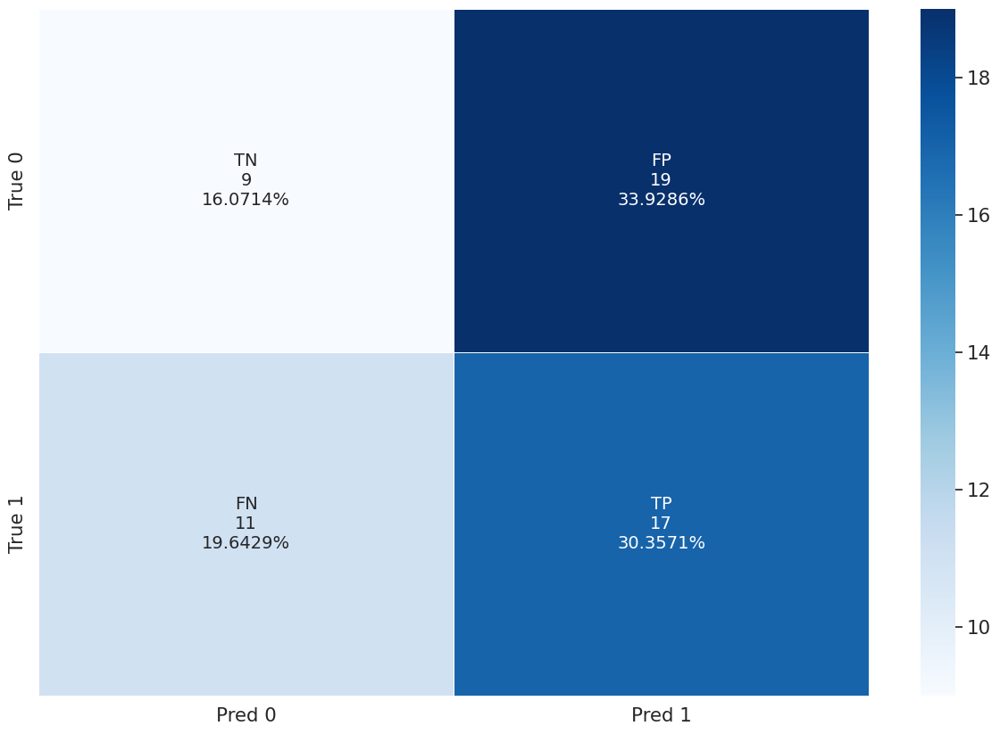

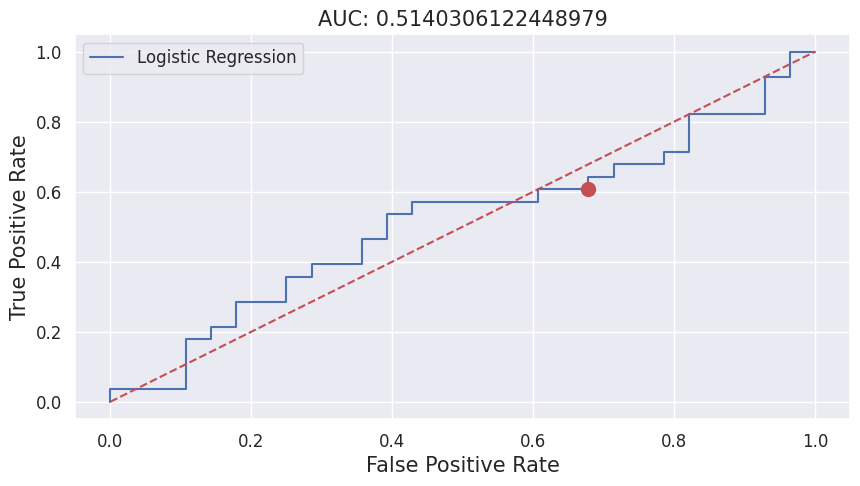

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,Train set,1510,535,346,409,220,0.5667,0.7086,0.4583,0.6298,0.5834,0.5834,0.6269
1,Logistic Regression,Validation(CV),186,83,0,103,0,0.4462,1.0000,0.0000,0.6171,0.4462,0.5000,0.5064
2,Logistic Regression,Test set,56,17,9,19,11,0.4722,0.6071,0.3214,0.5312,0.4643,0.4643,0.5140
3,Logistic Regression,Entire population,1566,552,355,428,231,0.5633,0.7050,0.4534,0.6262,0.5792,0.5792,0.6244


   [Save] Logistic Regression Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_Logistic Regression_20260515_093120.pkl
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_Logistic Regression_20260515_093120.json

   Running Machine Learning Algorithm: Random Forest (classification)
Learning...:  2026-05-15 09:31:20.619220


  0%|          | 0/30 [00:00<?, ?it/s]

[Random Forest] Best Optuna Score (F1-score):  0.5446009389671361
[Random Forest] Best Tuning Parameters:  {'n_estimators': 700, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_split': 10, 'min_samples_leaf': 1, 'bootstrap': False, 'random_state': 123, 'n_jobs': -1, 'class_weight': 'balanced_subsample'}

Explanations...:  2026-05-15 09:32:20.463080
Explanations of Y:


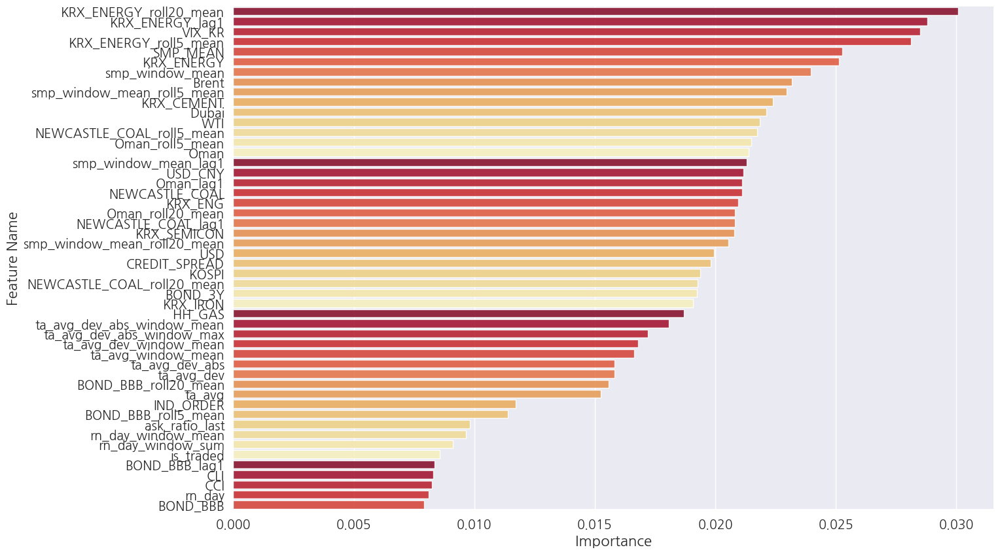

Performance Evaluations...:  2026-05-15 09:32:21.127910
Performance: 


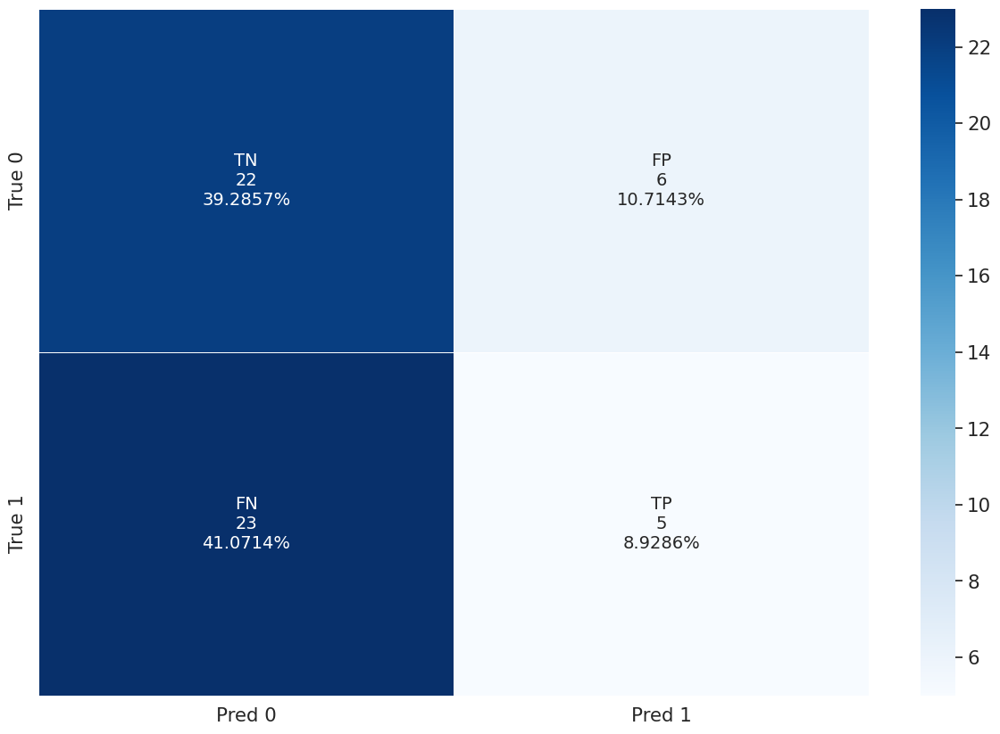

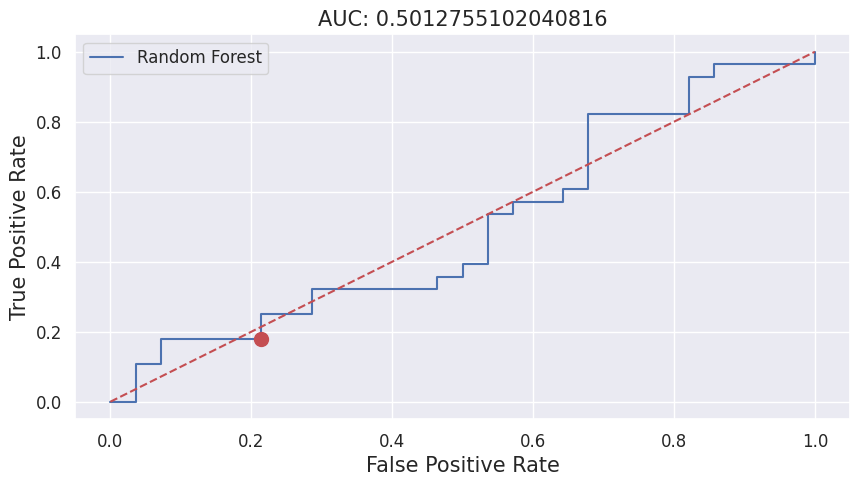

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,1510,755,755,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,Random Forest,Validation(CV),186,58,31,72,25,0.4462,0.6988,0.3010,0.5446,0.4785,0.4999,0.4908
2,Random Forest,Test set,56,5,22,6,23,0.4545,0.1786,0.7857,0.2564,0.4821,0.4821,0.5013
3,Random Forest,Entire population,1566,760,777,6,23,0.9922,0.9706,0.9923,0.9813,0.9815,0.9815,0.9993


   [Save] Random Forest Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_Random Forest_20260515_093223.pkl
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_Random Forest_20260515_093223.json

   Running Machine Learning Algorithm: XGBoost (classification)
Learning...:  2026-05-15 09:32:23.548691


  0%|          | 0/30 [00:00<?, ?it/s]

[XGBoost] Best Optuna Score (F1-score):  0.6194029850746269
[XGBoost] Best Tuning Parameters:  {'n_estimators': 350, 'max_depth': 4, 'learning_rate': 0.006448990442426056, 'subsample': 0.8560373816837414, 'colsample_bytree': 0.7462604093693892, 'min_child_weight': 2.102052348560603, 'gamma': 1.0225032956235114, 'reg_alpha': 0.018501361513562412, 'reg_lambda': 1.2171782188617454e-06, 'random_state': 123, 'n_jobs': -1, 'tree_method': 'hist', 'verbosity': 0, 'scale_pos_weight': 4.336097080745497}

Explanations...:  2026-05-15 09:36:57.218624
Explanations of Y:


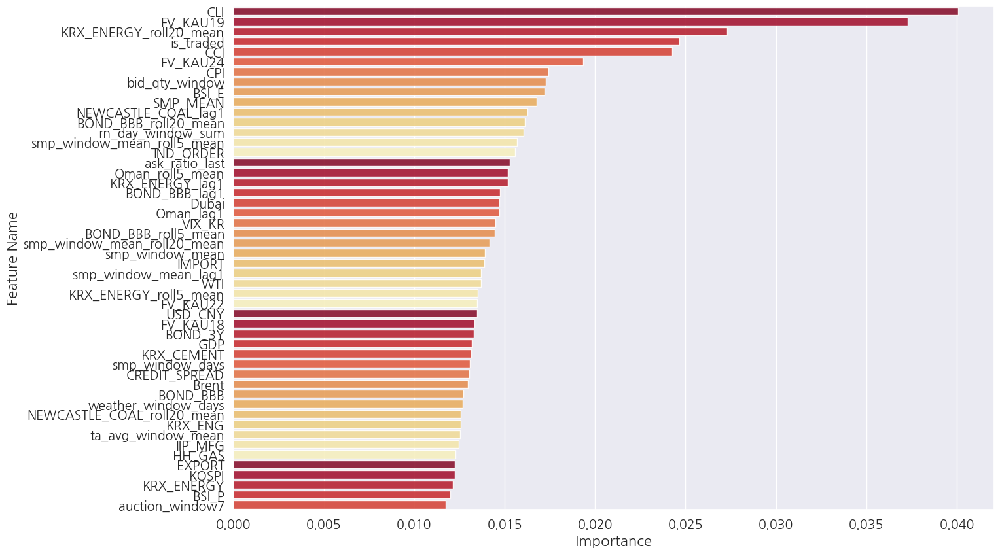

Performance Evaluations...:  2026-05-15 09:36:57.779551
Performance: 


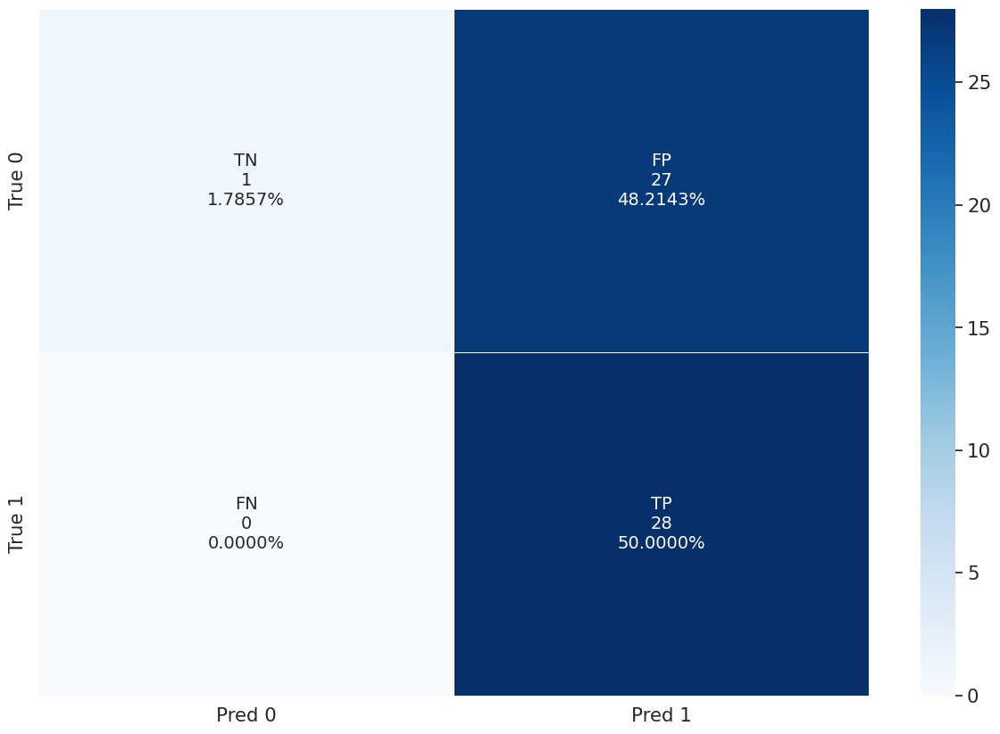

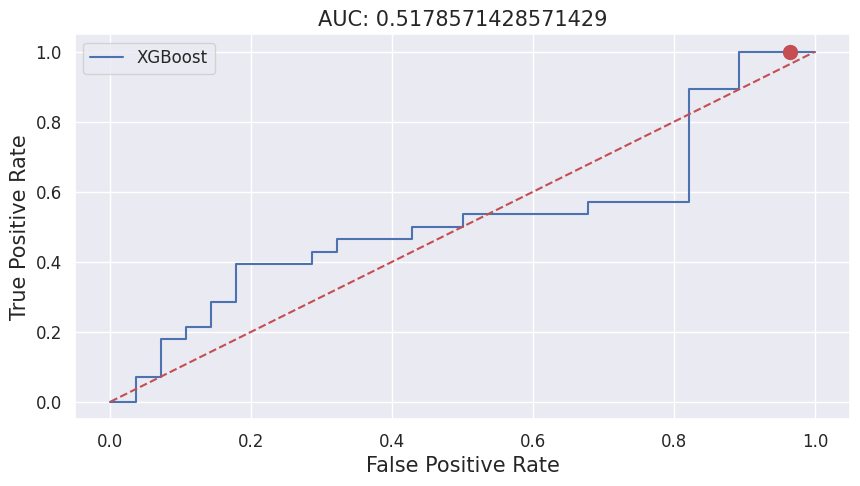

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,XGBoost,Train set,1510,755,118,637,0,0.5424,1.0000,0.1563,0.7033,0.5781,0.5781,0.8514
1,XGBoost,Validation(CV),186,83,1,102,0,0.4486,1.0000,0.0097,0.6194,0.4516,0.5049,0.4815
2,XGBoost,Test set,56,28,1,27,0,0.5091,1.0000,0.0357,0.6747,0.5179,0.5179,0.5179
3,XGBoost,Entire population,1566,783,119,664,0,0.5411,1.0000,0.1520,0.7022,0.5760,0.5760,0.8383


   [Save] XGBoost Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_XGBoost_20260515_093658.pkl
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_XGBoost_20260515_093658.json

   Running Machine Learning Algorithm: LightGBM (classification)
Learning...:  2026-05-15 09:36:58.475962


  0%|          | 0/30 [00:00<?, ?it/s]

[LightGBM] Best Optuna Score (F1-score):  0.5991561181434599
[LightGBM] Best Tuning Parameters:  {'n_estimators': 900, 'learning_rate': 0.2918741783583672, 'num_leaves': 171, 'max_depth': 13, 'min_child_samples': 53, 'subsample': 0.8190527716985017, 'colsample_bytree': 0.9235869588611944, 'min_split_gain': 0.18385905345147785, 'extra_trees': True, 'reg_alpha': 6.99999383205945e-08, 'reg_lambda': 4.119264785813593e-06, 'random_state': 123, 'n_jobs': -1, 'verbose': -1, 'class_weight': 'balanced'}

Explanations...:  2026-05-15 09:43:14.096880
Explanations of Y:


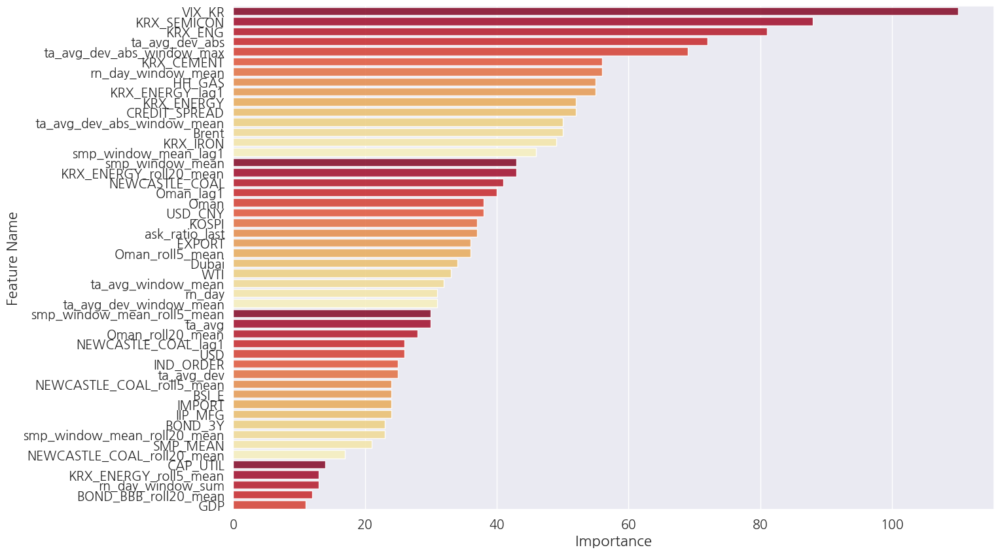

Performance Evaluations...:  2026-05-15 09:43:14.658181
Performance: 


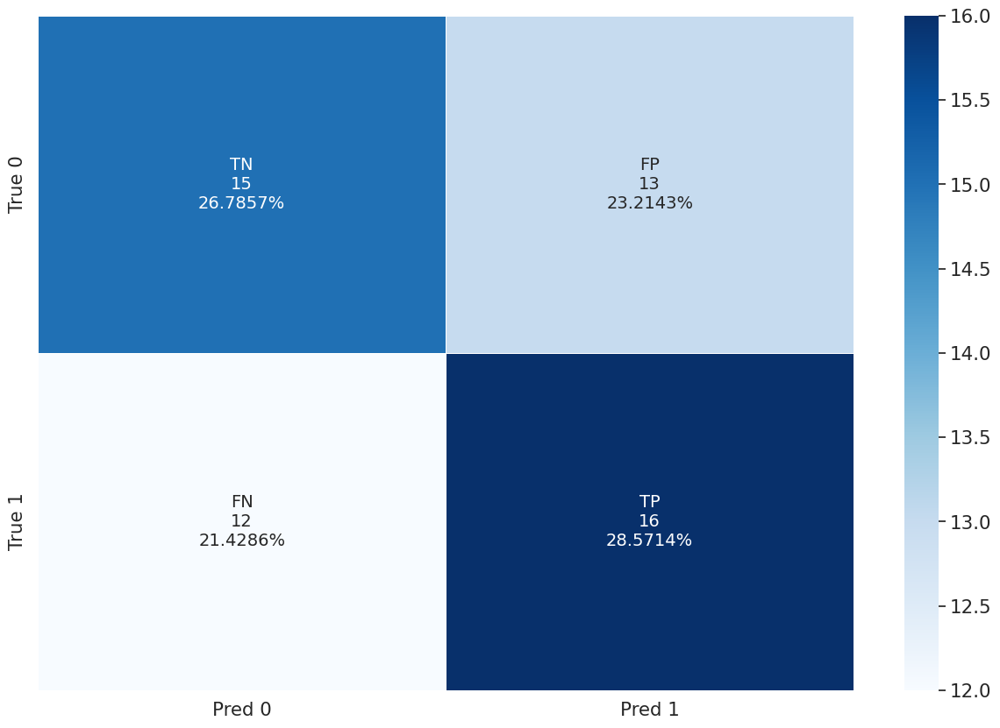

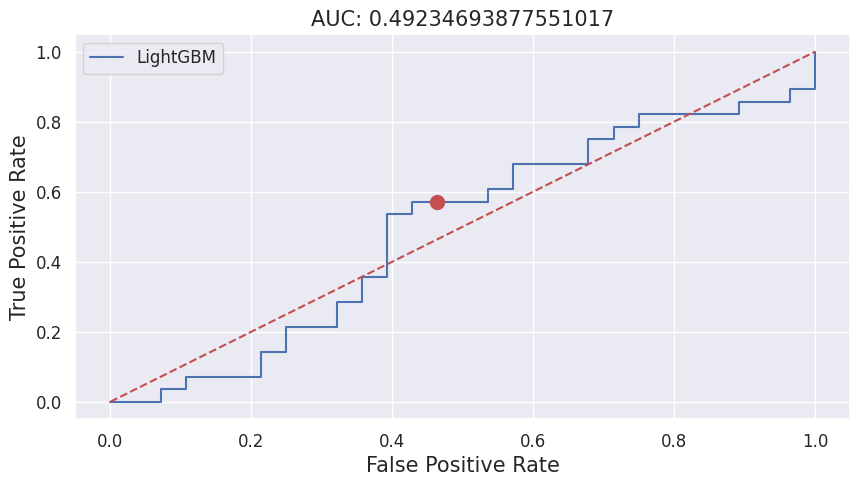

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,1510,645,632,123,110,0.8398,0.8543,0.8371,0.8470,0.8457,0.8457,0.9261
1,LightGBM,Validation(CV),186,71,20,83,12,0.4610,0.8554,0.1942,0.5992,0.4892,0.5248,0.4699
2,LightGBM,Test set,56,16,15,13,12,0.5517,0.5714,0.5357,0.5614,0.5536,0.5536,0.4923
3,LightGBM,Entire population,1566,661,647,136,122,0.8294,0.8442,0.8263,0.8367,0.8352,0.8352,0.9146


   [Save] LightGBM Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_LightGBM_20260515_094438.pkl
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_LightGBM_20260515_094438.json

   Running Machine Learning Algorithm: CatBoost (classification)
Learning...:  2026-05-15 09:44:38.606882


  0%|          | 0/30 [00:00<?, ?it/s]

[CatBoost] Best Optuna Score (F1-score):  0.5739910313901345
[CatBoost] Best Tuning Parameters:  {'iterations': 700, 'depth': 6, 'learning_rate': 0.09678421437223023, 'l2_leaf_reg': 5.18034041674566, 'subsample': 0.972791126693794, 'grow_policy': 'Depthwise', 'random_state': 123, 'verbose': 0, 'allow_writing_files': False}

Explanations...:  2026-05-15 09:49:11.435712
Explanations of Y:


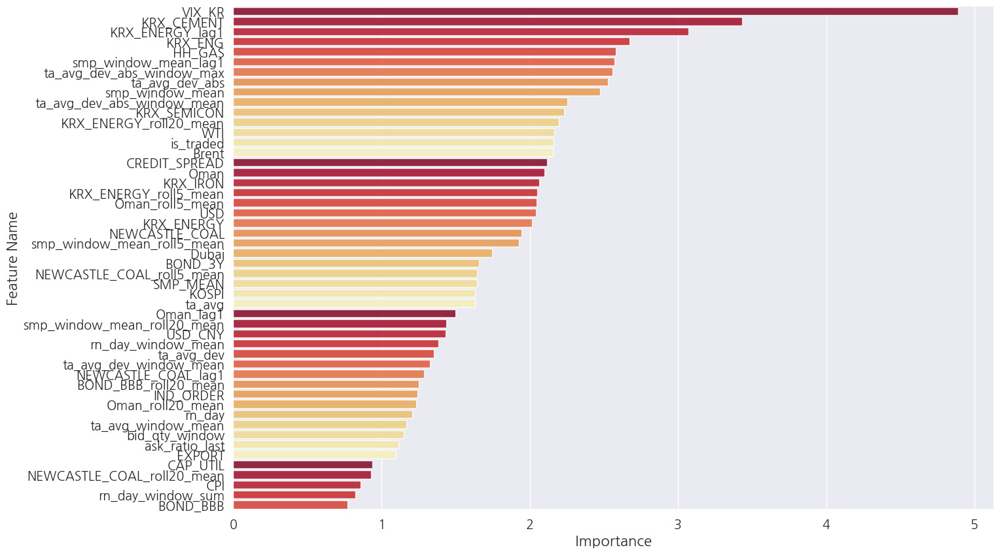

Performance Evaluations...:  2026-05-15 09:49:12.091670
Performance: 


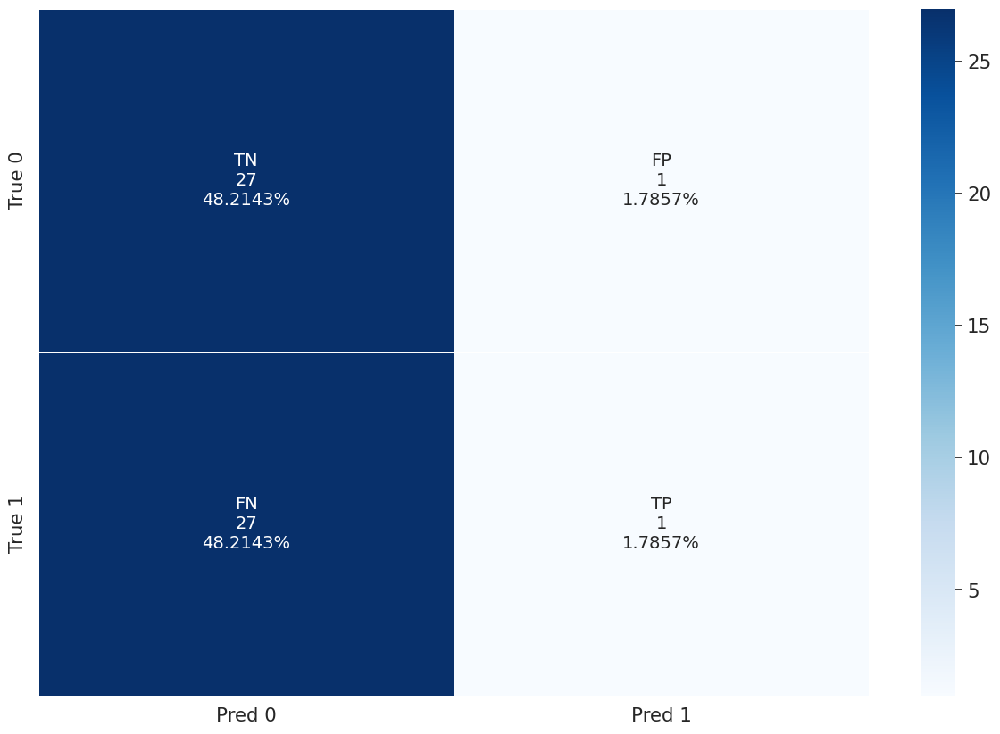

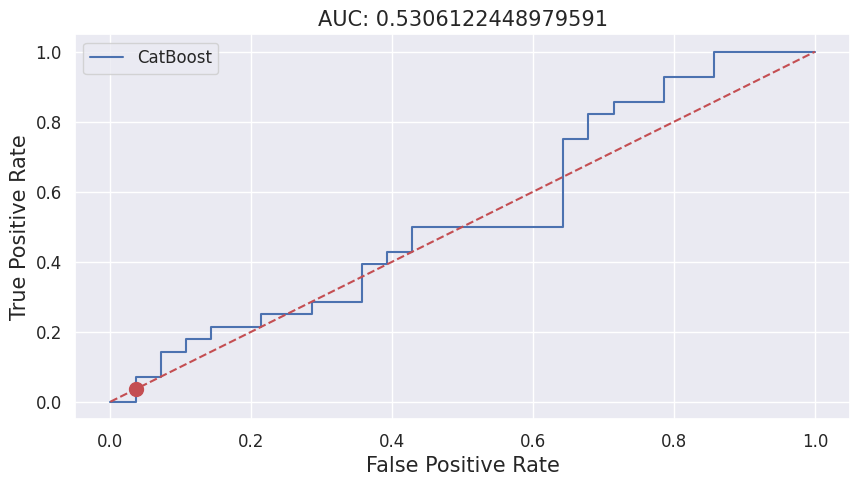

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,CatBoost,Train set,1510,755,755,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,CatBoost,Validation(CV),186,52,46,57,31,0.4571,0.7711,0.2621,0.5740,0.4892,0.5166,0.5054
2,CatBoost,Test set,56,1,27,1,27,0.5000,0.0357,0.9643,0.0667,0.5000,0.5000,0.5306
3,CatBoost,Entire population,1566,756,782,1,27,0.9987,0.9655,0.9987,0.9818,0.9821,0.9821,0.9823


   [Save] CatBoost Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_CatBoost_20260515_094924.pkl
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_CatBoost_20260515_094924.json

   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,Train set,1510,535,346,409,220,0.566737,0.708609,0.458278,0.629782,0.583444,0.583444,0.626936
4,Random Forest,Train set,1510,755,755,0,0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,XGBoost,Train set,1510,755,118,637,0,0.542385,1.000000,0.156291,0.703307,0.578146,0.578146,0.851439
12,LightGBM,Train set,1510,645,632,123,110,0.839844,0.854305,0.837086,0.847012,0.845695,0.845695,0.926110
16,CatBoost,Train set,1510,755,755,0,0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,Logistic Regression,Validation(CV),186,83,0,103,0,0.446237,1.000000,0.000000,0.617100,0.446237,0.500000,0.506375
5,Random Forest,Validation(CV),186,58,31,72,25,0.446154,0.698795,0.300971,0.544601,0.478495,0.499883,0.490818
9,XGBoost,Validation(CV),186,83,1,102,0,0.448649,1.000000,0.009709,0.619403,0.451613,0.504854,0.481460
13,LightGBM,Validation(CV),186,71,20,83,12,0.461039,0.855422,0.194175,0.599156,0.489247,0.524798,0.469880
17,CatBoost,Validation(CV),186,52,46,57,31,0.457143,0.771084,0.262136,0.573991,0.489247,0.516610,0.505439


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,Logistic Regression,Test set,56,17,9,19,11,0.472222,0.607143,0.321429,0.531250,0.464286,0.464286,0.514031
6,Random Forest,Test set,56,5,22,6,23,0.454545,0.178571,0.785714,0.256410,0.482143,0.482143,0.501276
10,XGBoost,Test set,56,28,1,27,0,0.509091,1.000000,0.035714,0.674699,0.517857,0.517857,0.517857
14,LightGBM,Test set,56,16,15,13,12,0.551724,0.571429,0.535714,0.561404,0.553571,0.553571,0.492347
18,CatBoost,Test set,56,1,27,1,27,0.500000,0.035714,0.964286,0.066667,0.500000,0.500000,0.530612


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
3,Logistic Regression,Entire population,1566,552,355,428,231,0.563265,0.704981,0.453384,0.626205,0.579183,0.579183,0.624418
7,Random Forest,Entire population,1566,760,777,6,23,0.992167,0.970626,0.992337,0.981278,0.981481,0.981481,0.999266
11,XGBoost,Entire population,1566,783,119,664,0,0.541120,1.000000,0.151980,0.702242,0.575990,0.575990,0.838269
15,LightGBM,Entire population,1566,661,647,136,122,0.829360,0.844189,0.826309,0.836709,0.835249,0.835249,0.914621
19,CatBoost,Entire population,1566,756,782,1,27,0.998679,0.965517,0.998723,0.981818,0.982120,0.982120,0.982326


test
Saved total performance to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/Performance_ML(Trial30).csv
Saved total parameters to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/Hyperparams_ML(Trial30).csv
Saved total results object to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/Best_Result_ML(Trial30).pkl


In [15]:
# Setting
algorithm_list = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']

# ML 실행
results_ML, scores_ML = modeling_ML(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname,
    params=None, # 특정 알고리즘
    tune_trials=TUNE_TRIALS_ML, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC,
    shap=not SHAP, 
    X_selected=None, # shap에서만 작동
    interaction=not INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    X_top_display=X_TOP_DISPLAY, 
    label_list=LABEL_LIST,
)

## Deep Learning

In [ ]:
# # Setting
# algorithm_list = ['MLP', 'CNN']
# TUNE_TRIALS = None
# # TUNE_TRIALS = 10

# # DL 실행
# results_DL, scores_DL = modeling_DL(
#     algos=algorithm_list,
#     X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
#     node_list=None, # 특정 알고리즘
#     validation_split=VALIDATION_SPLIT,
#     validation_data=VALIDATION_DATA,
#     tune_trials=TUNE_TRIALS, # 최적화 여부
#     cv_splits=CV_SPLITS,
#     tune_metric=TUNE_METRIC_DL,
#     epochs=EPOCHS-500,
#     batch_size=BATCH_SIZE,
#     earlystop_patient=None,
#     shap_display=False,
#     label_list=LABEL_LIST,
#     random_state=RANDOM_STATE,
# )

▶ Detected Task Type: [ classification ] (Target: binary)

[Info] Applying Out-Of-Time (OOT) Validation using cv_splits indices.

   Running Deep Learning Algorithm: MLP (classification)
[Info] Starting Hyperparameter Optimization (Trials: 10)...


  0%|          | 0/10 [00:00<?, ?it/s]

I0000 00:00:1778771381.747326    1067 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5518 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9
Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:09:44.099461: I external/local_xla/xla/service/service.cc:163] XLA service 0x76f19c00eb70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-05-15 00:09:44.099573: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2026-05-15 00:09:44.177986: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-05-15 00:09:44.393421: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002
2026-05-15 00:09:44.552653: I exter

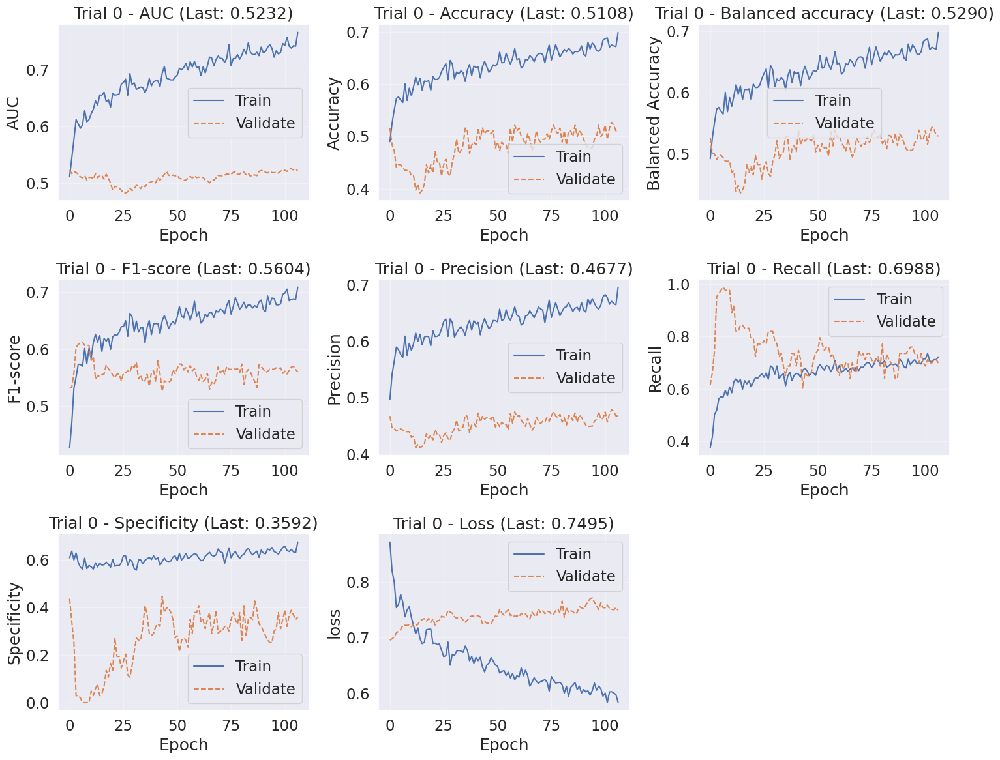

Training Progress:  11%|█         | 107/1000 [02:05<17:25,  1.17s/it]
2026-05-15 00:11:48.050296: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:48.050395: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:48.683714: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_131', 16 bytes spill stores, 16 bytes spill loads



1/6 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step

2026-05-15 00:11:49.229965: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:49.230037: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:49.864464: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_131', 16 bytes spill stores, 16 bytes spill loads



6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:11:53.208654: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:53.208701: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:11:53.766382: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_997', 12 bytes spill stores, 12 bytes spill loads

2026-05-15 00:11:53.852588: I external/local_xla/xla/stream_ex

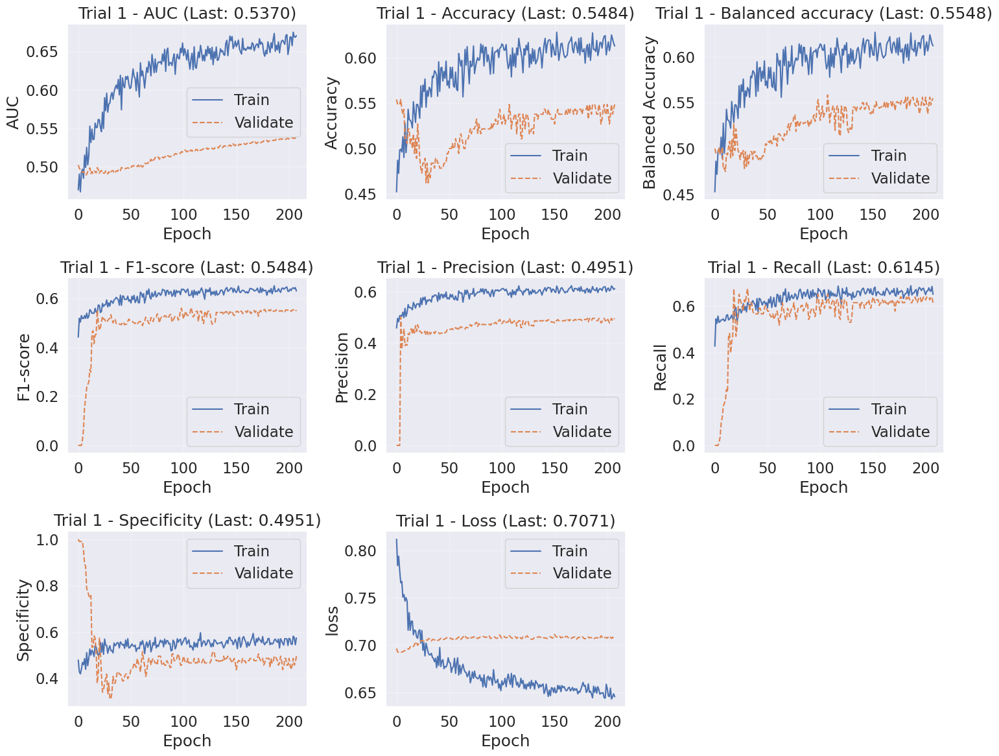

Training Progress:  21%|██        | 208/1000 [03:07<11:55,  1.11it/s]
2026-05-15 00:14:59.998532: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


1/6 ━━━━━━━━━━━━━━━━━━━━ 3s 633ms/step

2026-05-15 00:15:00.658249: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:15:03.831943: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:15:03.832010: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:15:03.832025: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full 

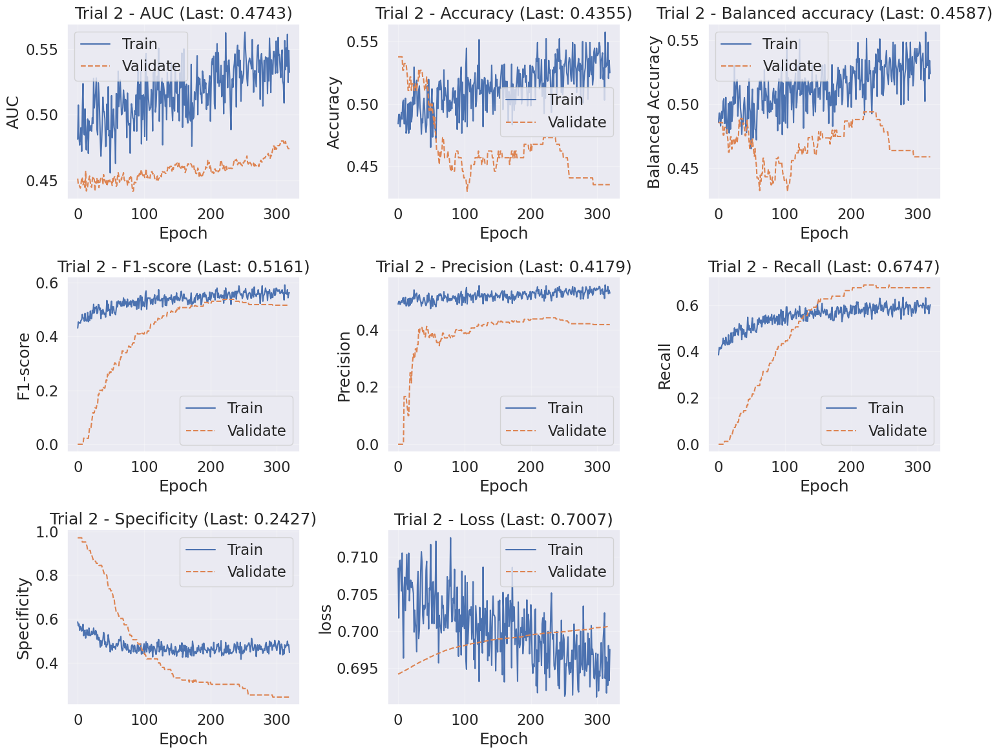

Training Progress:  32%|███▏      | 320/1000 [04:46<10:08,  1.12it/s]
2026-05-15 00:19:49.086619: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:19:49.086673: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


1/6 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step

2026-05-15 00:19:50.272356: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:19:50.272407: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 187ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:19:54.917355: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:19:54.917401: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:19:55.367884: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1212', 4 bytes spill stores, 4 bytes spill loads

2026-05-15 00:19:55.600440: I external/local_xla/xla/stream_exe

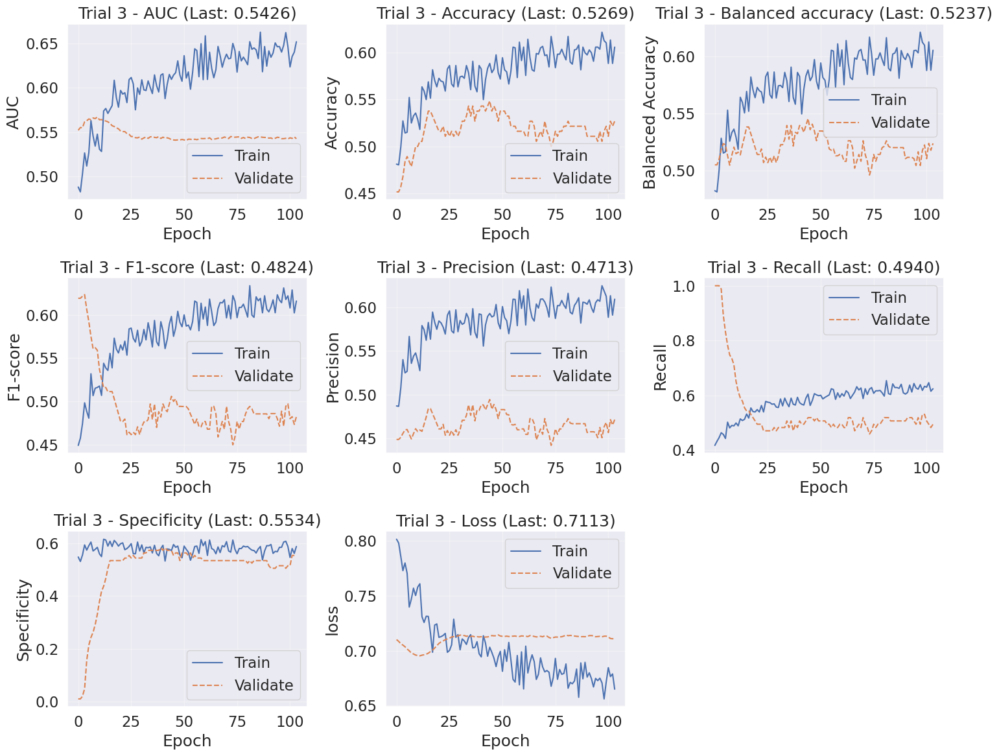

Training Progress:  10%|█         | 104/1000 [01:38<14:06,  1.06it/s]
2026-05-15 00:21:32.333164: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


1/6 ━━━━━━━━━━━━━━━━━━━━ 3s 651ms/step

2026-05-15 00:21:32.973494: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:21:38.060473: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:21:38.060518: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:21:38.542316: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_898', 12 bytes spill stores, 12 bytes spill loads

2026-05-15 00:21:38.739926: I external/local_xla/xla/stream_ex

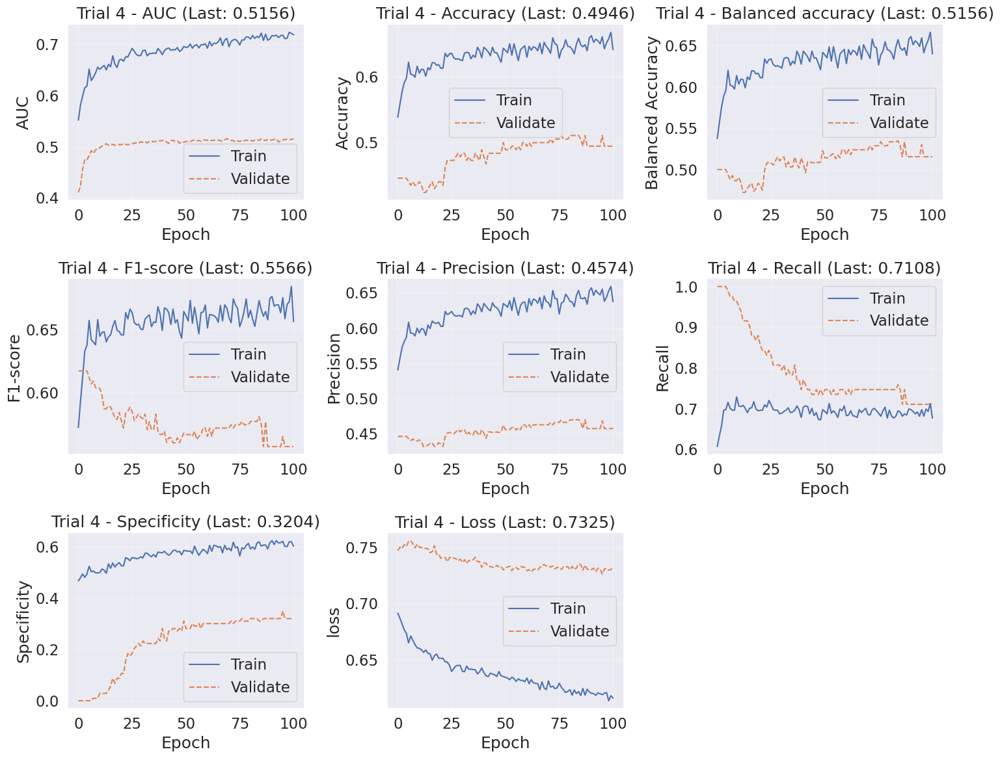

Training Progress:  10%|█         | 101/1000 [01:36<14:20,  1.04it/s]

1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:23:19.362684: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:23:19.817152: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2235', 8 bytes spill stores, 8 bytes spill loads

2026-05-15 00:23:19.896678: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2235', 240 bytes spill stores, 240 bytes spill loads



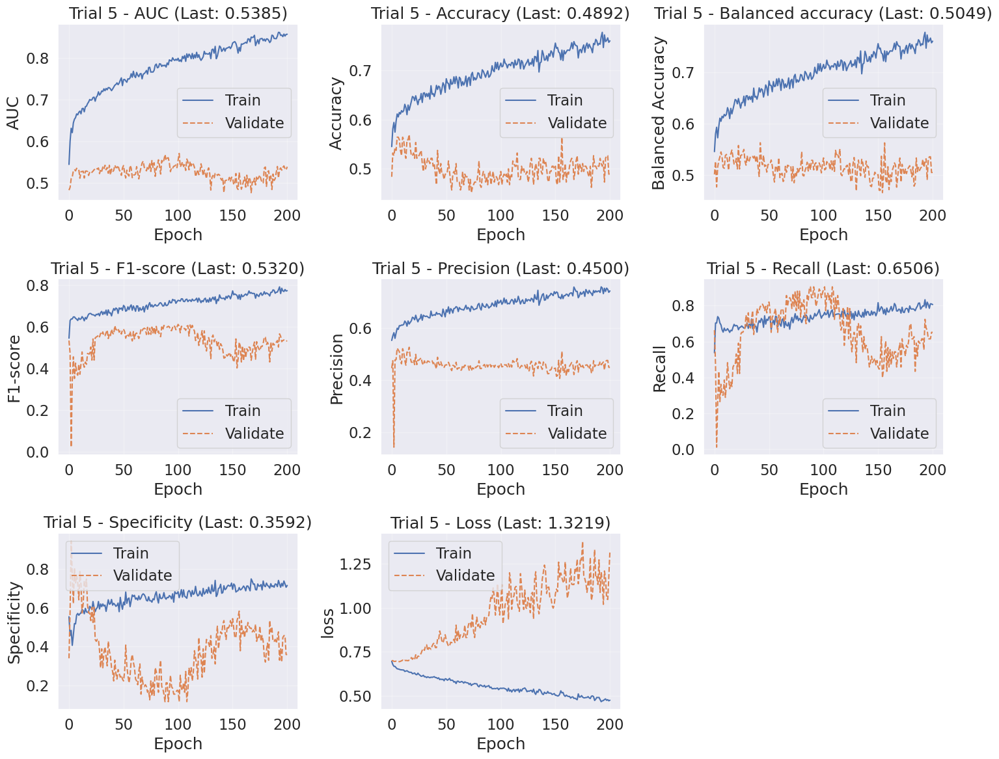

Training Progress:  20%|██        | 201/1000 [03:26<13:40,  1.03s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

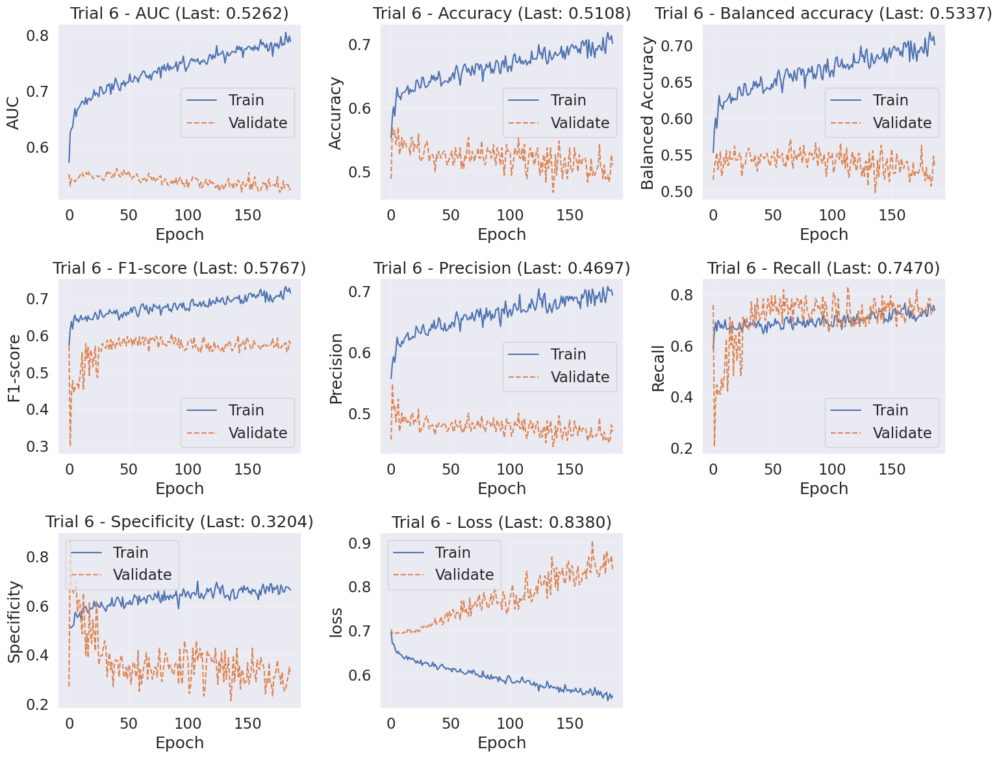

Training Progress:  19%|█▊        | 187/1000 [02:50<12:21,  1.10it/s]

1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:29:45.853790: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:29:45.853857: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:29:46.337730: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1466', 4 bytes spill stores, 4 bytes spill loads

2026-05-15 00:29:46.482744: I external/local_xla/xla/stream_exe

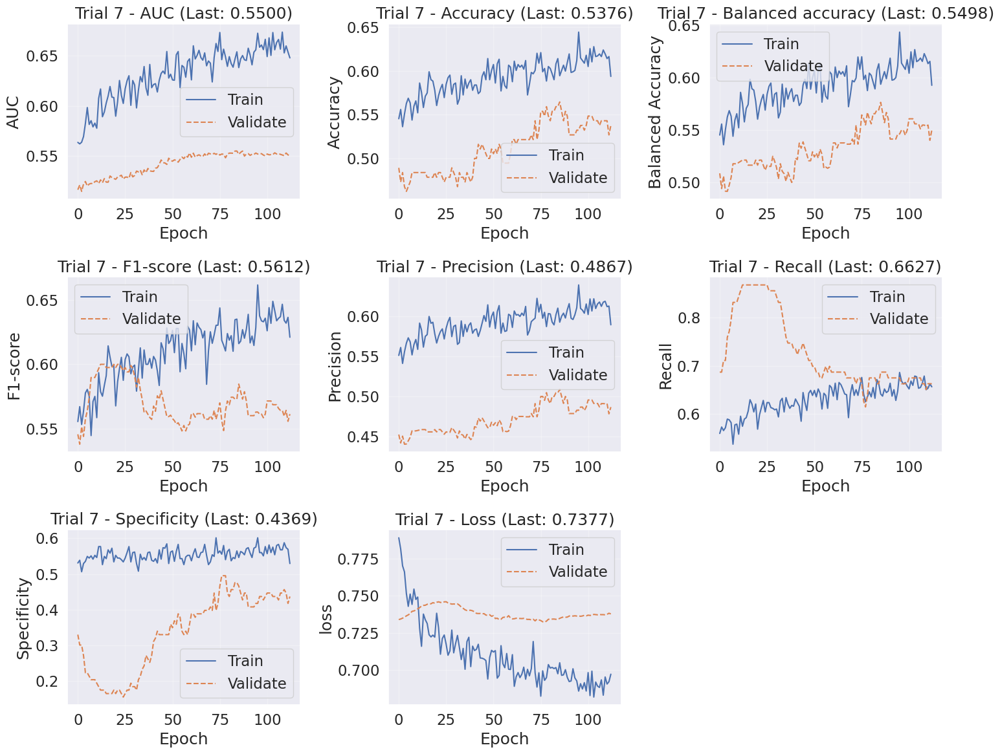

Training Progress:  11%|█▏        | 113/1000 [01:42<13:25,  1.10it/s]

1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]2026-05-15 00:31:34.752189: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:31:34.752243: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:31:34.752256: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full 

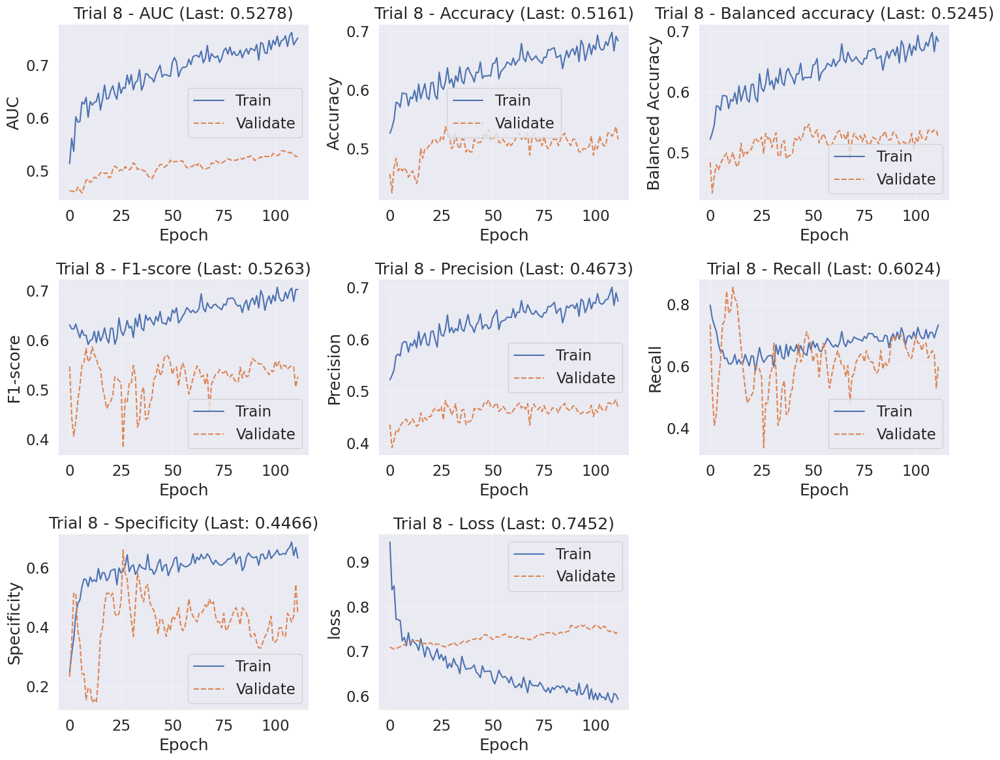

Training Progress:  11%|█         | 112/1000 [01:50<14:39,  1.01it/s]
2026-05-15 00:33:24.202135: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2026-05-15 00:33:24.426589: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_131', 12 bytes spill stores, 12 bytes spill loads



1/6 ━━━━━━━━━━━━━━━━━━━━ 3s 729ms/step

2026-05-15 00:33:24.936223: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

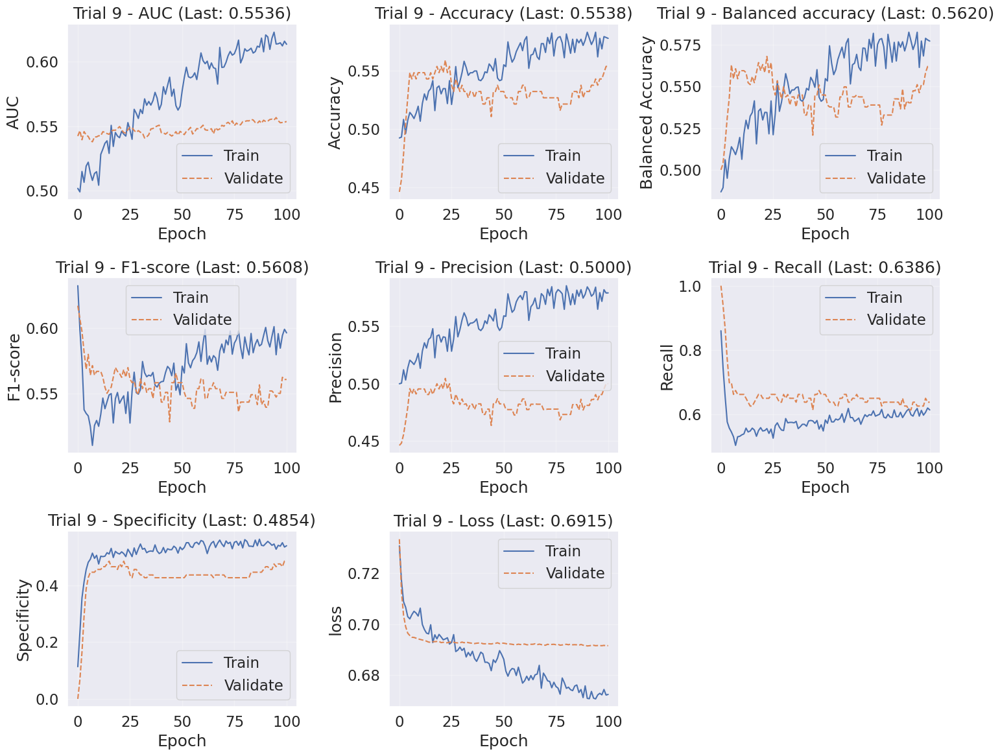

Training Progress:  10%|█         | 101/1000 [01:32<13:47,  1.09it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Trial:  0 State:  TrialState.COMPLETE Best Epoch:  6
Metrics:  {'AUC': 0.602755069732666, 'Accuracy': 0.5649546980857849, 'Balanced Accuracy': 0.5649009943008423, 'F1-score': 0.5701492288283129, 'Precision': 0.5718562602996826, 'Recall': 0.5684523582458496, 'Specificity': 0.5613496899604797, 'loss': 0.7640371918678284, 'val_AUC': 0.5091239213943481, 'val_Accuracy': 0.44086021184921265, 'val_Balanced Accuracy': 0.4939759075641632, 'val_F1-score': 0.6119402925000275, 'val_Precision': 0.44324323534965515, 'val_Recall': 0.9879518151283264, 'val_Specificity': 0.0, 'val_loss': 0.7221227884292603, 'val_N': 186.0, 'val_True Positive': 82.0, 'val_True Negative': 0.0, 'val_False Positive': 103.0, 'val_False Negative': 1.0}

Trial:  1 State:  TrialState.COMPLETE Best Epoch:  107
Metrics:  {'AUC': 0.640006422996521, 'Accuracy': 0.5913897156715393, 'Balanced Accuracy': 0.590623140335083, 'F1-score': 0.614397729646782, 'Precision': 0.5896033048629761, 'Recall': 

Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

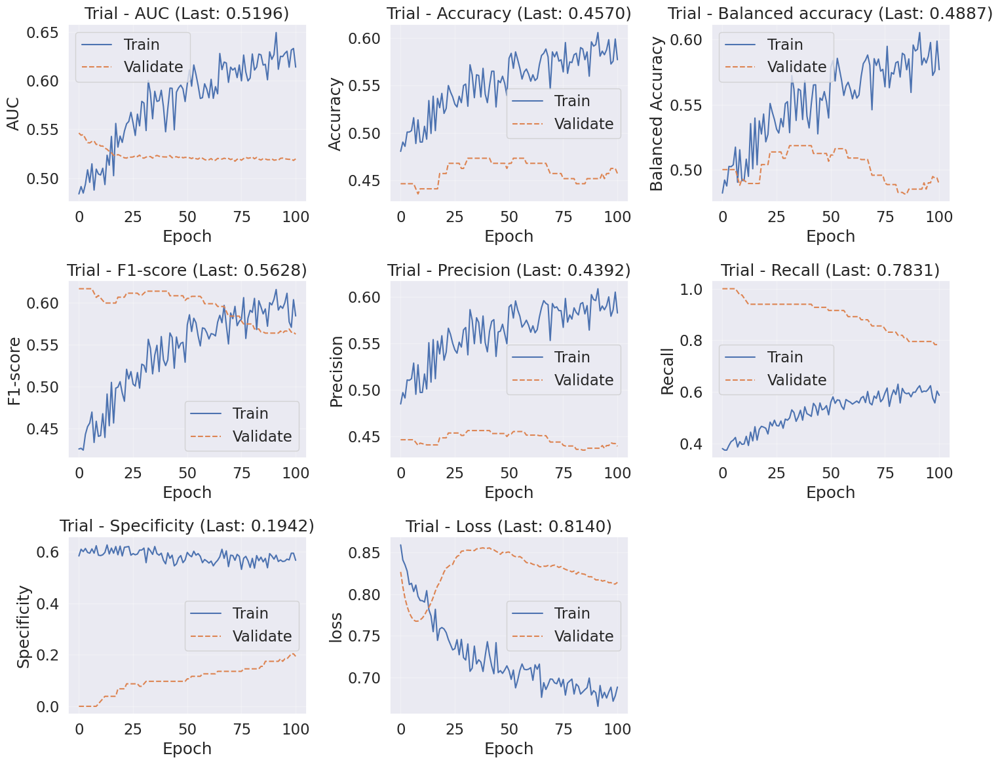

Training Progress:  10%|█         | 101/1000 [01:34<13:57,  1.07it/s]


   [Save] MLP Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_MLP_20260515_003646.keras
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_MLP_20260515_003646.json
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

2026-05-15 00:36:46.898594: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
Performance: 


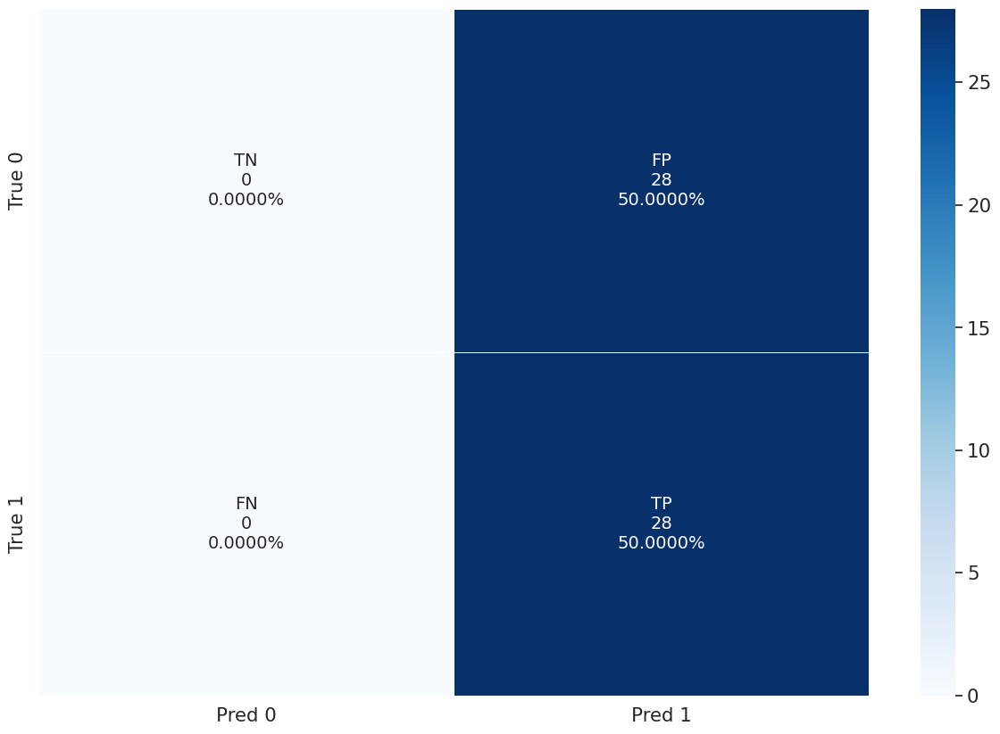

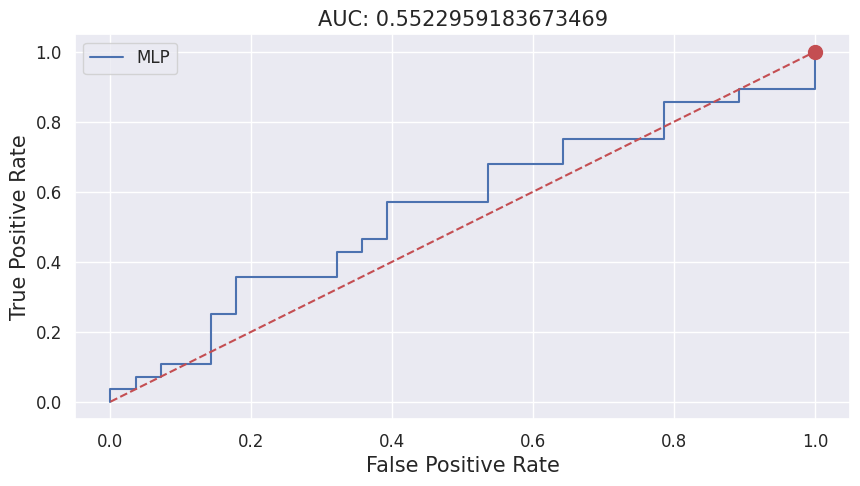

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

   Running Deep Learning Algorithm: CNN (classification)
[Info] Starting Hyperparameter Optimization (Trials: 10)...


  0%|          | 0/10 [00:00<?, ?it/s]

Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

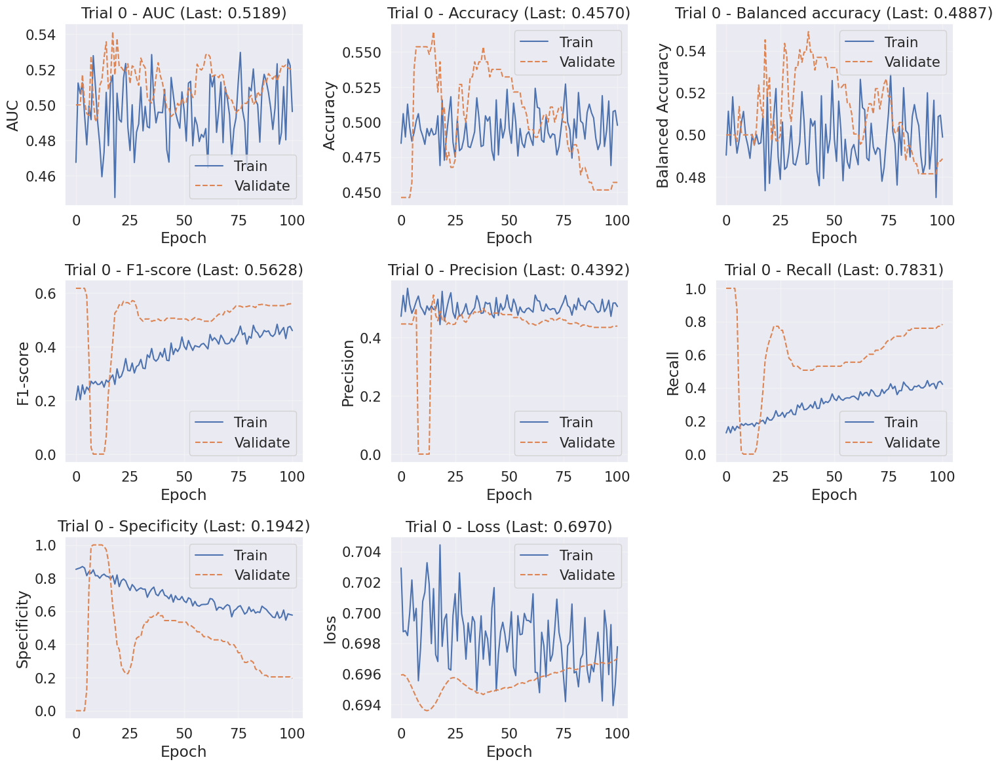

Training Progress:  10%|█         | 101/1000 [01:40<14:52,  1.01it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

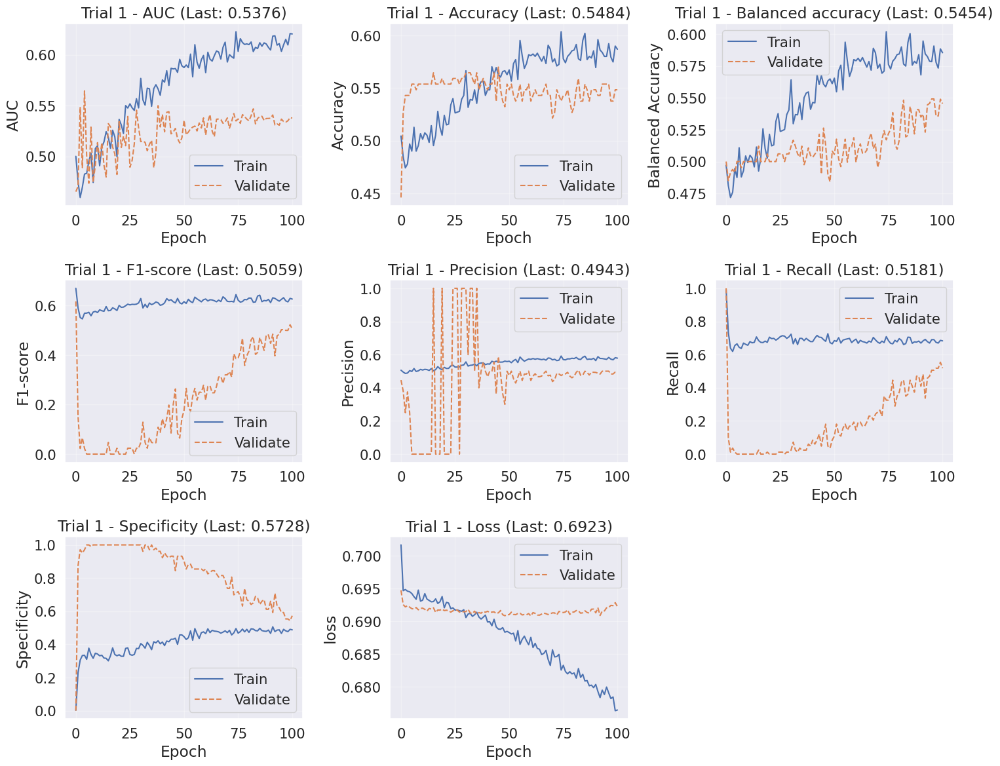

Training Progress:  10%|█         | 101/1000 [01:43<15:18,  1.02s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

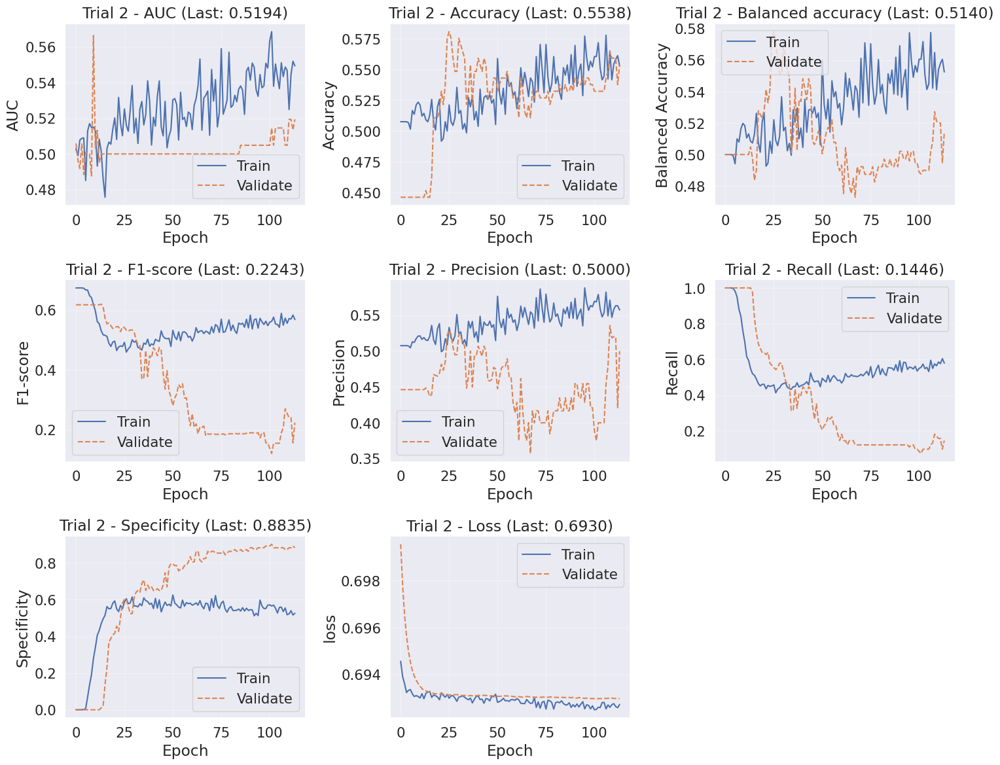

Training Progress:  11%|█▏        | 114/1000 [02:03<15:58,  1.08s/it]

1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

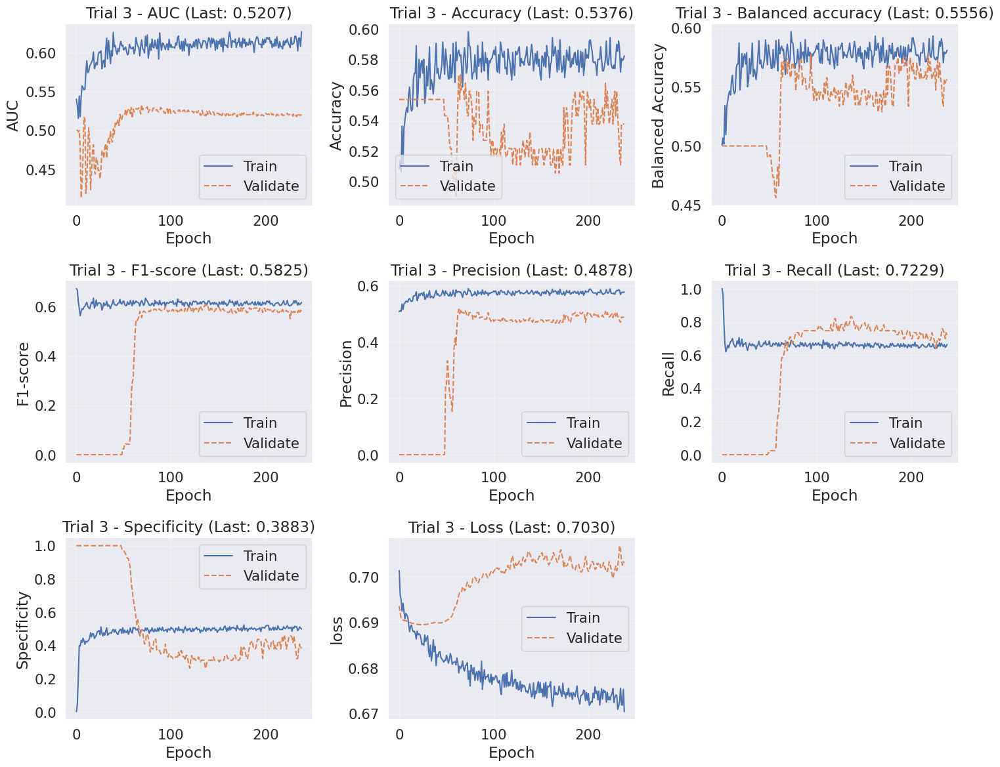

Training Progress:  24%|██▍       | 239/1000 [03:48<12:09,  1.04it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

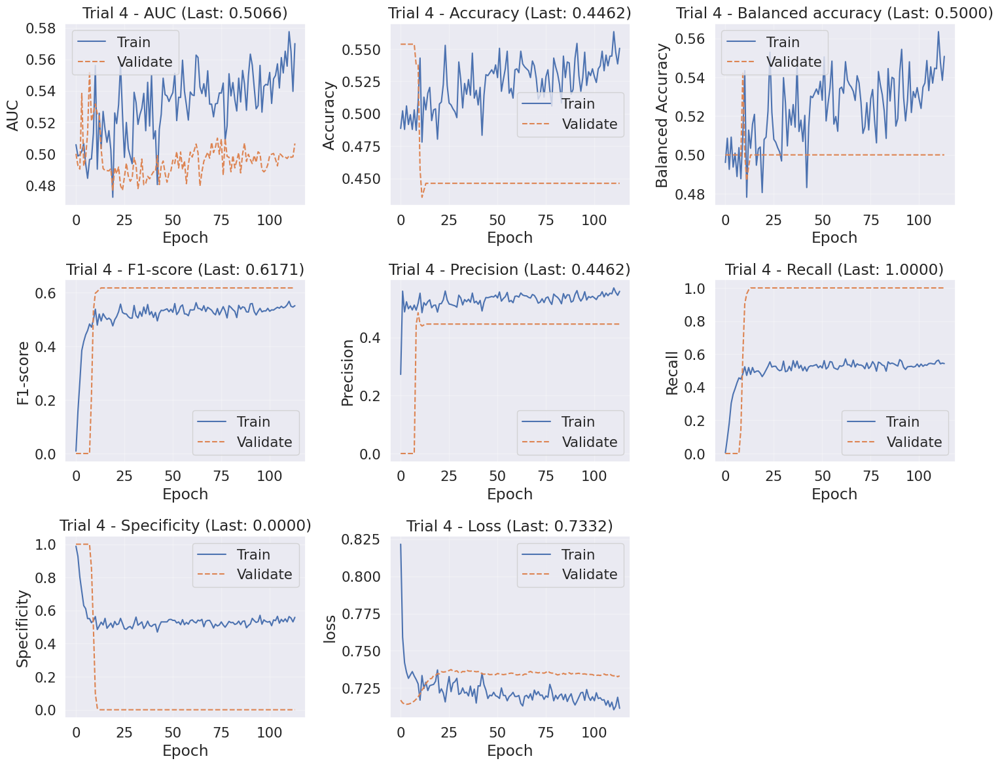

Training Progress:  11%|█▏        | 114/1000 [02:09<16:44,  1.13s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

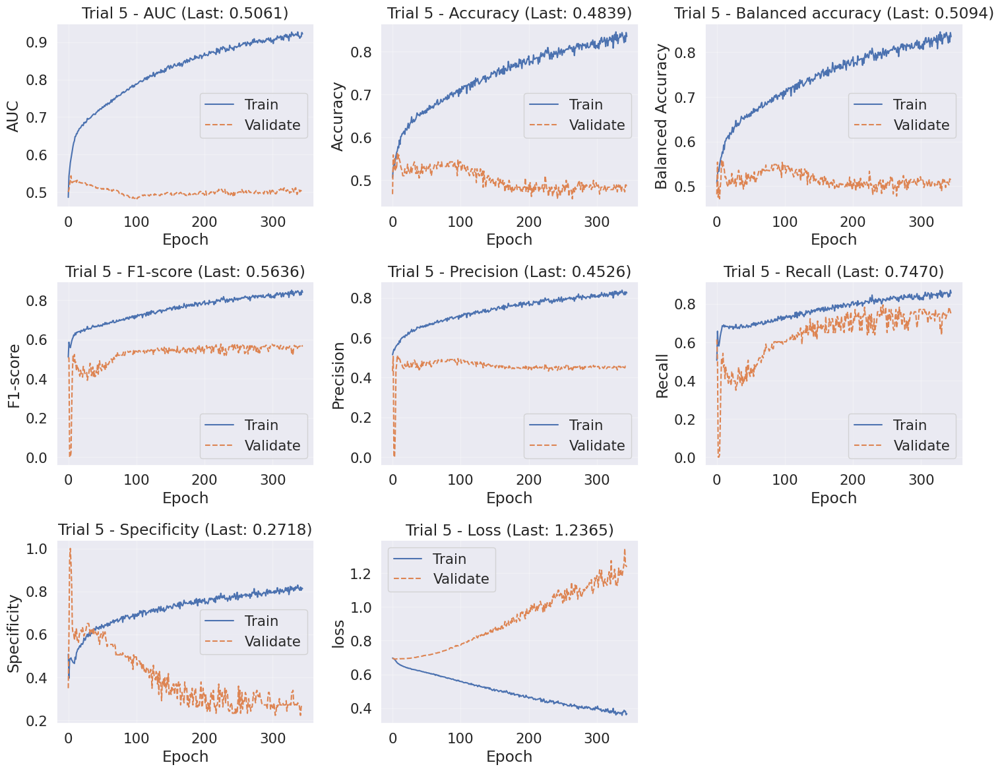

Training Progress:  34%|███▍      | 345/1000 [06:31<12:24,  1.14s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

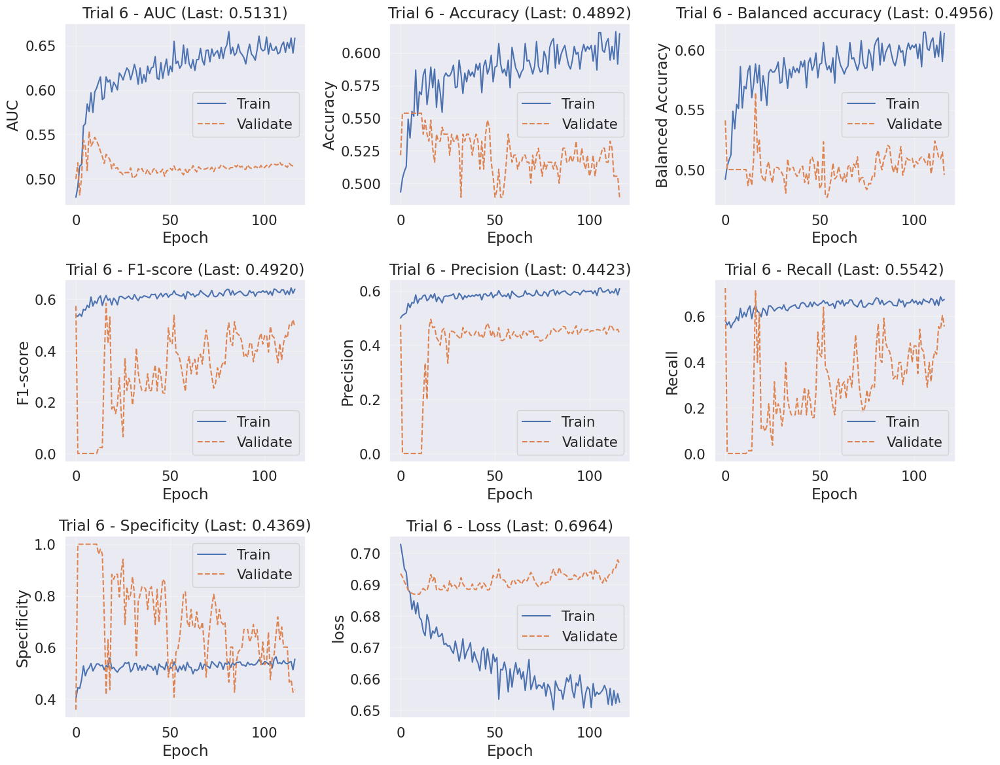

Training Progress:  12%|█▏        | 117/1000 [02:07<16:03,  1.09s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

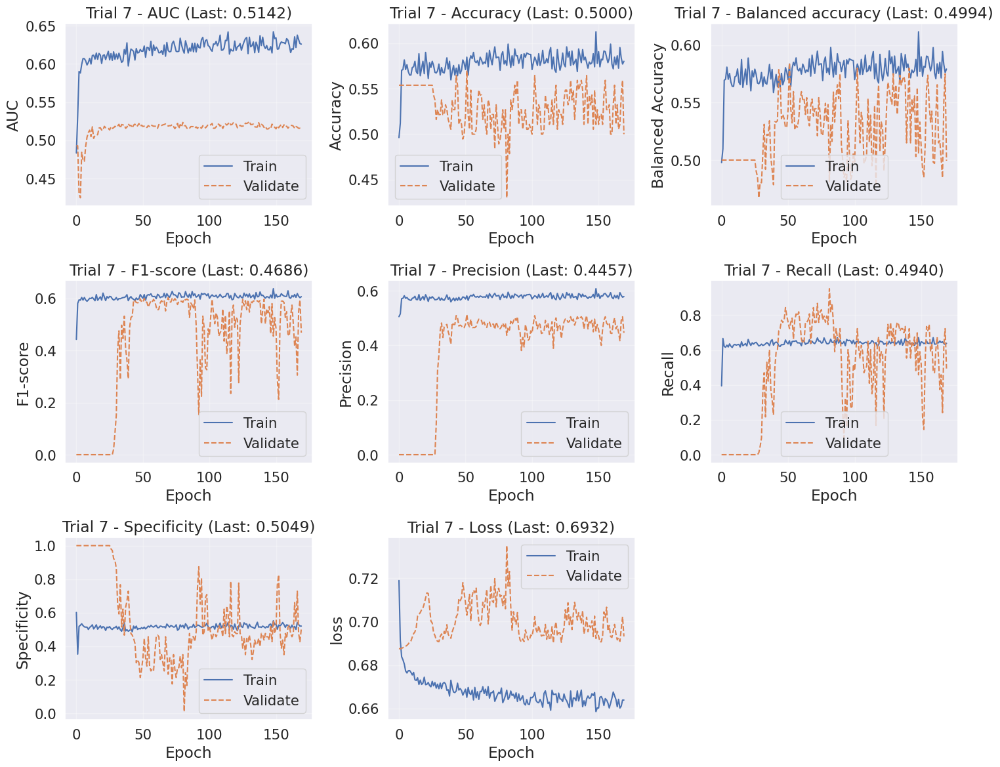

Training Progress:  17%|█▋        | 170/1000 [02:44<13:22,  1.03it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

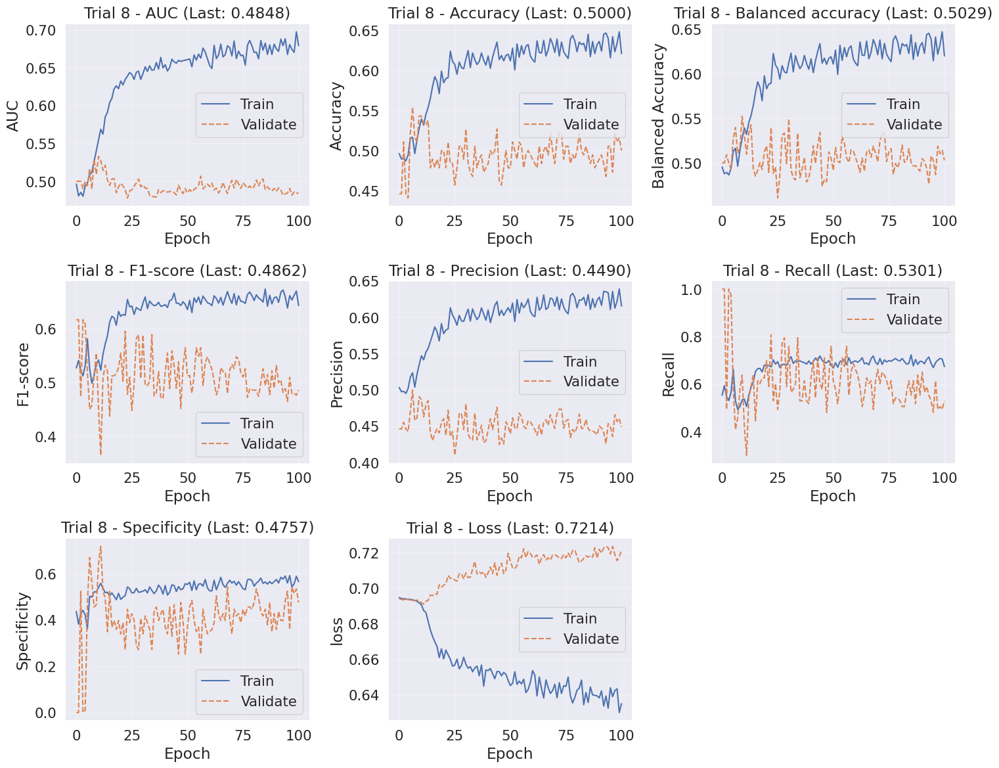

Training Progress:  10%|█         | 101/1000 [01:43<15:18,  1.02s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

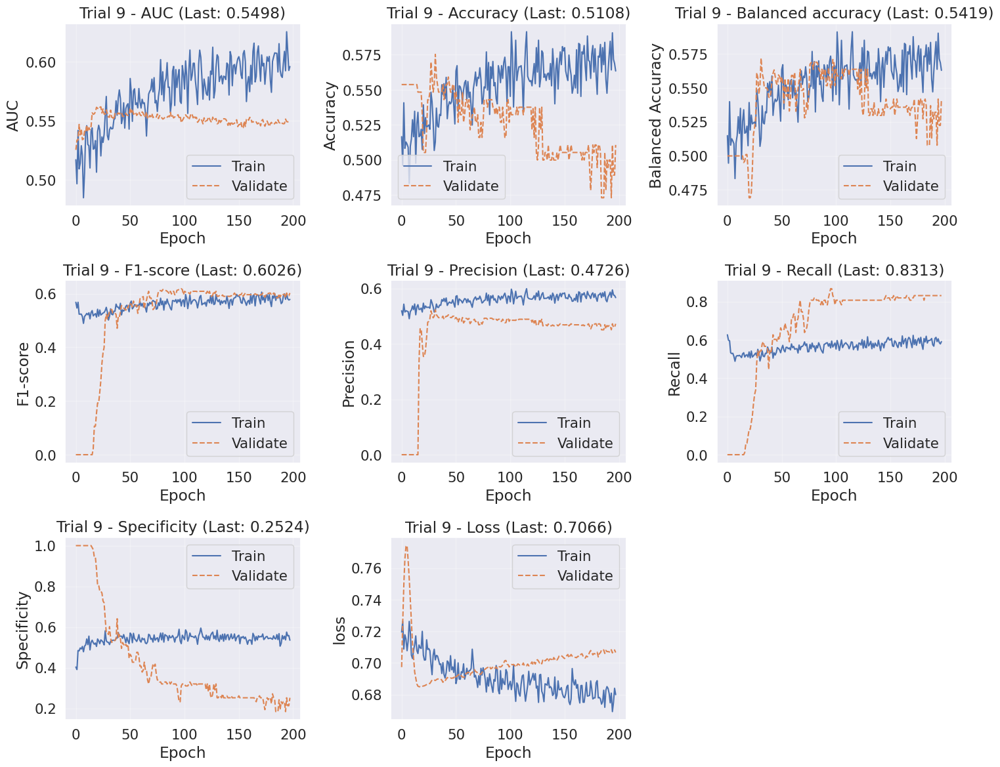

Training Progress:  20%|█▉        | 198/1000 [03:37<14:41,  1.10s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
Trial:  0 State:  TrialState.COMPLETE Best Epoch:  0
Metrics:  {'AUC': 0.46749696135520935, 'Accuracy': 0.4848942458629608, 'Balanced Accuracy': 0.49036845564842224, 'F1-score': 0.2014051567671985, 'Precision': 0.47252747416496277, 'Recall': 0.127976194024086, 'Specificity': 0.8527607321739197, 'loss': 0.7029122114181519, 'val_AUC': 0.5, 'val_Accuracy': 0.4462365508079529, 'val_Balanced Accuracy': 0.5, 'val_F1-score': 0.6171003637802666, 'val_Precision': 0.4462365508079529, 'val_Recall': 1.0, 'val_Specificity': 0.0, 'val_loss': 0.6959185600280762, 'val_N': 186.0, 'val_True Positive': 83.0, 'val_True Negative': 0.0, 'val_False Positive': 103.0, 'val_False Negative': 0.0}

Trial:  1 State:  TrialState.COMPLETE Best Epoch:  0
Metrics:  {'AUC': 0.4999919831752777, 'Accuracy': 0.504531741142273, 'Balanced Accuracy': 0.49706944823265076, 'F1-score': 0.6700201067889501, 'Precision': 0.5060790181159973, 'Recall': 0.9910714030265808, 'Specificity': 0.003067

Training Progress:   0%|          | 0/1000 [00:00<?, ?it/s]

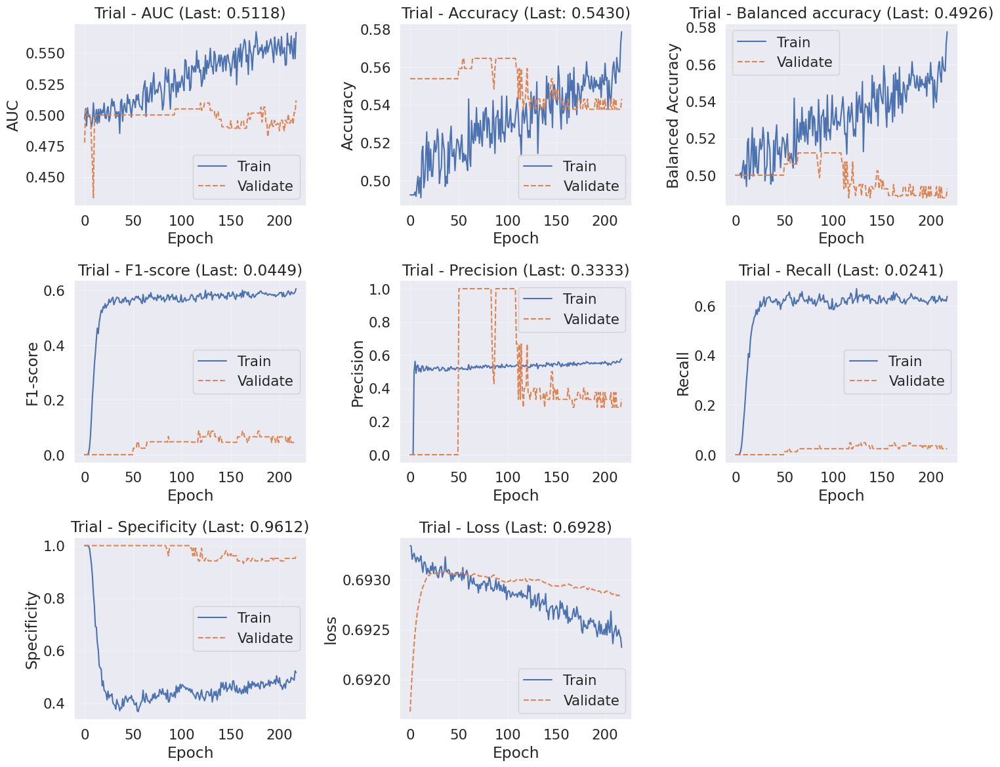

Training Progress:  22%|██▏       | 218/1000 [03:41<13:16,  1.02s/it]


   [Save] CNN Checkpoint Saved:
     - Model : /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_model_CNN_20260515_010941.keras
     - Params: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/best_params_CNN_20260515_010941.json
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
Performance: 


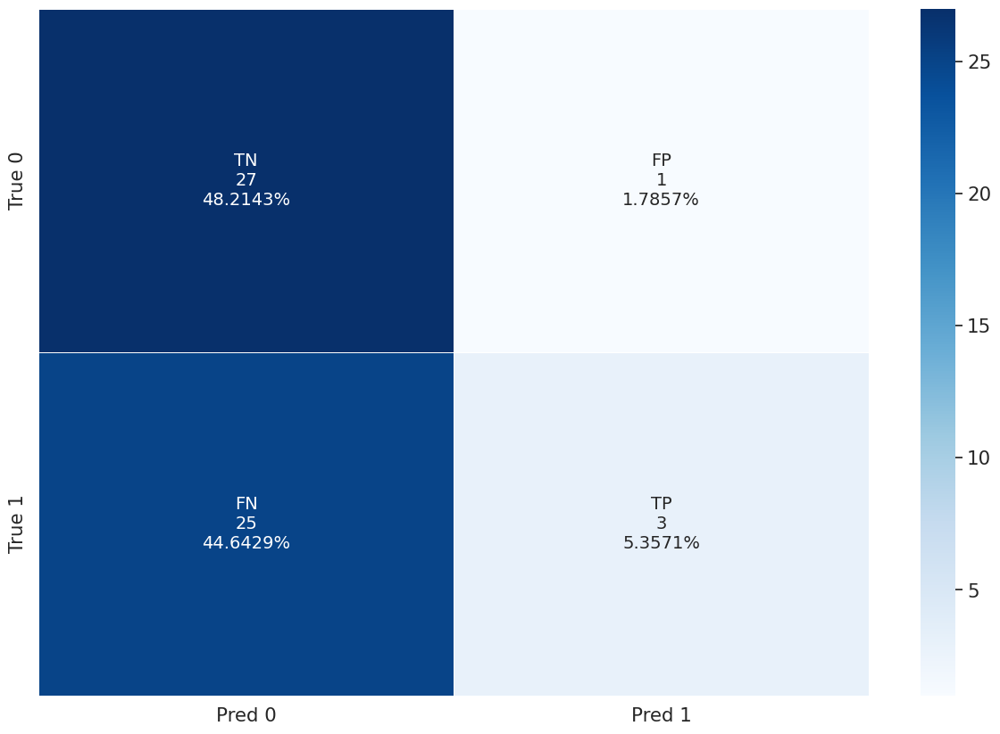

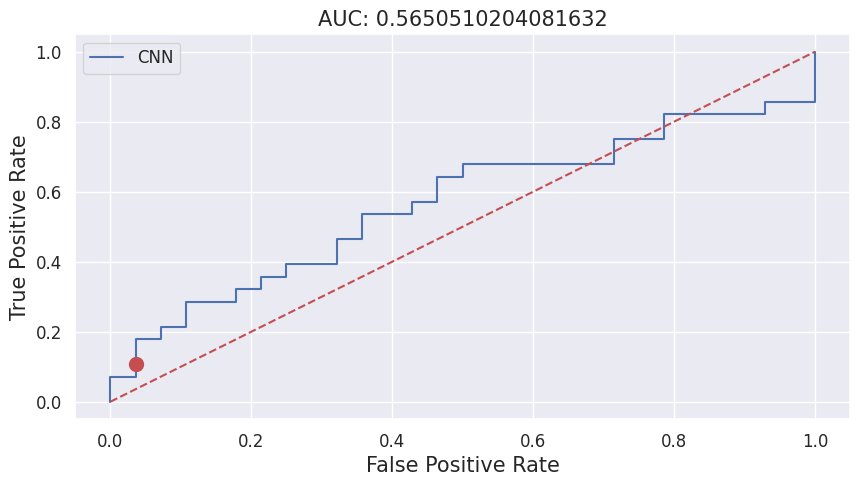

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,MLP,Train set,1510,755,0,755,0,0.500000,1.000000,0.000000,0.666667,0.500000,0.500000,0.447352
4,CNN,Train set,1510,412,392,363,343,0.531613,0.545695,0.519205,0.538562,0.532450,0.532450,0.543580


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,MLP,Validation(CV),186,83,0,103,0,0.446237,1.000000,0.000000,0.617100,0.446237,0.500000,0.546204
5,CNN,Validation(CV),186,4,97,6,79,0.400000,0.048193,0.941748,0.086022,0.543011,0.494970,0.504854


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,MLP,Test set,56,28,0,28,0,0.500000,1.000000,0.000000,0.666667,0.500000,0.500000,0.559311
6,CNN,Test set,56,3,27,1,25,0.750000,0.107143,0.964286,0.187500,0.535714,0.535714,0.446429


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
3,MLP,Entire population,1566,783,0,783,0,0.500000,1.000000,0.000000,0.666667,0.500000,0.500000,0.450516
7,CNN,Entire population,1566,415,419,364,368,0.532734,0.530013,0.535121,0.531370,0.532567,0.532567,0.540519


Saved total performance to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/Performance_DL(Trial10).csv
Saved total parameters to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/Hyperparams_DL(Trial10).csv
Saved total results object to: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/Best_Result_DL(Trial10).pkl


In [9]:
# Setting
algorithm_list = ['MLP', 'CNN']
# algorithm_list = ['CNN']

# DL 실행
results_DL, scores_DL = modeling_DL(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    node_list=None, # 특정 알고리즘
    validation_split=VALIDATION_SPLIT,
    validation_data=VALIDATION_DATA,
    tune_trials=TUNE_TRIALS_DL, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC_DL,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    earlystop_patient=None,
    shap_display=False,
    label_list=LABEL_LIST,
    random_state=RANDOM_STATE,
)

# Performance Summary

In [16]:
# Algorithms Loaded
algo_names = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost', 'MLP', 'CNN']
# algo_names = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']

# Result Summary
folder_location = os.path.join(os.getcwd(),'Result')
scores = prediction_summary(
    folder_location=folder_location, 
    algonames=algo_names,
    
    save_name=SAVE_NAME_PERFORMANCE,
)

### Performance Summary : 7 Algorithms ###

>>> [Train set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,1510,535,346,409,220,0.5667,0.7086,0.4583,0.6298,0.5834,0.5834,0.6269
1,Random Forest,1510,755,755,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,XGBoost,1510,755,118,637,0,0.5424,1.0000,0.1563,0.7033,0.5781,0.5781,0.8514
3,LightGBM,1510,645,632,123,110,0.8398,0.8543,0.8371,0.8470,0.8457,0.8457,0.9261
4,CatBoost,1510,755,755,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,MLP,1510,755,0,755,0,0.5000,1.0000,0.0000,0.6667,0.5000,0.5000,0.4474
6,CNN,1510,412,392,363,343,0.5316,0.5457,0.5192,0.5386,0.5325,0.5325,0.5436



>>> [Validation(CV)] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,186,83,0,103,0,0.4462,1.0000,0.0000,0.6171,0.4462,0.5000,0.5064
1,Random Forest,186,58,31,72,25,0.4462,0.6988,0.3010,0.5446,0.4785,0.4999,0.4908
2,XGBoost,186,83,1,102,0,0.4486,1.0000,0.0097,0.6194,0.4516,0.5049,0.4815
3,LightGBM,186,71,20,83,12,0.4610,0.8554,0.1942,0.5992,0.4892,0.5248,0.4699
4,CatBoost,186,52,46,57,31,0.4571,0.7711,0.2621,0.5740,0.4892,0.5166,0.5054
5,MLP,186,83,0,103,0,0.4462,1.0000,0.0000,0.6171,0.4462,0.5000,0.5462
6,CNN,186,4,97,6,79,0.4000,0.0482,0.9417,0.0860,0.5430,0.4950,0.5049



>>> [Test set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,56,17,9,19,11,0.4722,0.6071,0.3214,0.5312,0.4643,0.4643,0.5140
1,Random Forest,56,5,22,6,23,0.4545,0.1786,0.7857,0.2564,0.4821,0.4821,0.5013
2,XGBoost,56,28,1,27,0,0.5091,1.0000,0.0357,0.6747,0.5179,0.5179,0.5179
3,LightGBM,56,16,15,13,12,0.5517,0.5714,0.5357,0.5614,0.5536,0.5536,0.4923
4,CatBoost,56,1,27,1,27,0.5000,0.0357,0.9643,0.0667,0.5000,0.5000,0.5306
5,MLP,56,28,0,28,0,0.5000,1.0000,0.0000,0.6667,0.5000,0.5000,0.5593
6,CNN,56,3,27,1,25,0.7500,0.1071,0.9643,0.1875,0.5357,0.5357,0.4464



>>> [Entire population] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,1566,552,355,428,231,0.5633,0.7050,0.4534,0.6262,0.5792,0.5792,0.6244
1,Random Forest,1566,760,777,6,23,0.9922,0.9706,0.9923,0.9813,0.9815,0.9815,0.9993
2,XGBoost,1566,783,119,664,0,0.5411,1.0000,0.1520,0.7022,0.5760,0.5760,0.8383
3,LightGBM,1566,661,647,136,122,0.8294,0.8442,0.8263,0.8367,0.8352,0.8352,0.9146
4,CatBoost,1566,756,782,1,27,0.9987,0.9655,0.9987,0.9818,0.9821,0.9821,0.9823
5,MLP,1566,783,0,783,0,0.5000,1.0000,0.0000,0.6667,0.5000,0.5000,0.4505
6,CNN,1566,415,419,364,368,0.5327,0.5300,0.5351,0.5314,0.5326,0.5326,0.5405


# Best Model Prediction

▶ Searching Directory: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model
Loading Model: XGBoost
   - File: best_model_XGBoost_20260515_000023.pkl
   - Successfully Loaded.
Performance: 


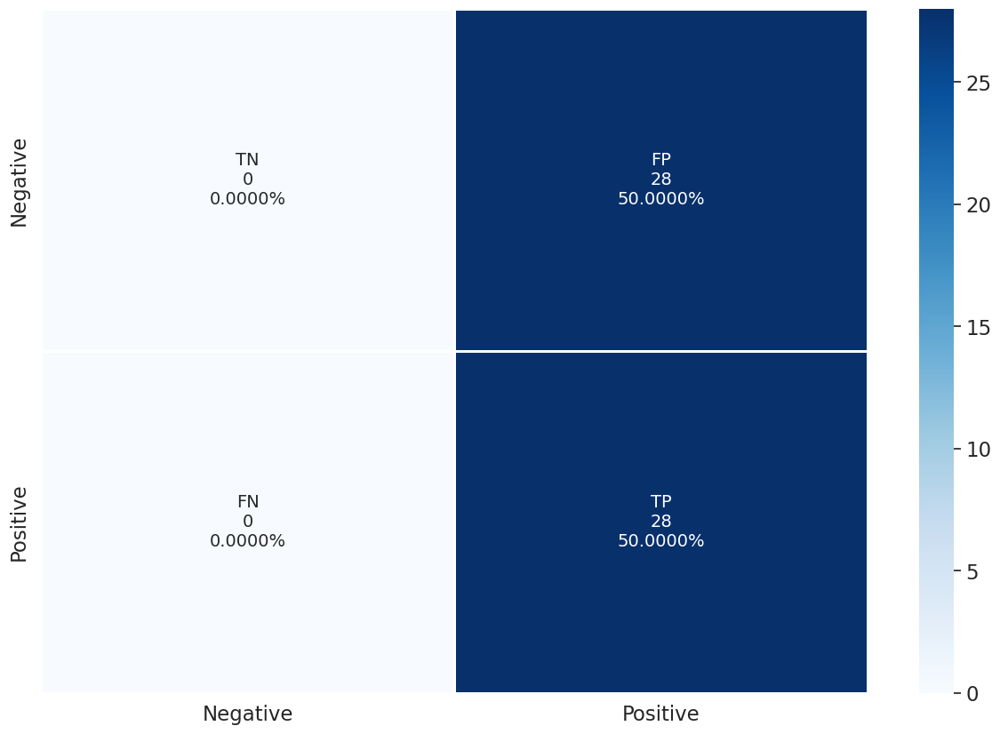

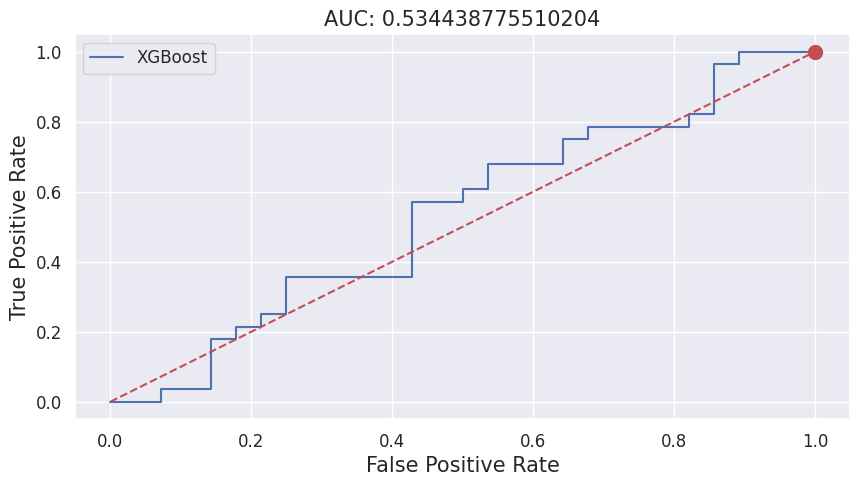

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,XGBoost,Train set,1510,754,212,543,1,0.5813,0.9987,0.2808,0.7349,0.6397,0.6397,0.9187
1,XGBoost,Test set,56,28,0,28,0,0.5000,1.0000,0.0000,0.6667,0.5000,0.5000,0.5344
2,XGBoost,Entire population,1566,782,212,571,1,0.5780,0.9987,0.2708,0.7322,0.6347,0.6347,0.9090


In [11]:
# Model Loaded
best_scoreidx = np.argmax(scores[scores.Dataset=='Test set'][METRIC_FINAL])
best_algo = scores[scores.Dataset=='Test set'].iloc[best_scoreidx]['Algorithm']
# best_algo = 'XGBoost'
best_model, best_params = Loading_ModelBestParams(algo_name=best_algo)

# Performance Evaluation
Scores_Test = prediction_class(best_model, X_train, Y_train, X_test, Y_test,
                             LABEL_LIST=LABEL_LIST, ALGO_NAME=best_algo, keras=False)
display(Scores_Test)

# Explanation

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: XGBoost (classification)
Explanations...:  2026-05-15 10:00:21.635239
Total SHAP Calculation...: 2026-05-15 10:00:21.650137


 98%|===================| 1476/1510 [00:23<00:00]        

SHAP values saved to /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/shap_values_XGBoost_20260515_100045.pkl
Train Dataset: 2026-05-15 10:00:45.371672
Total Explanation (Beeswarm + Importance Bar)...


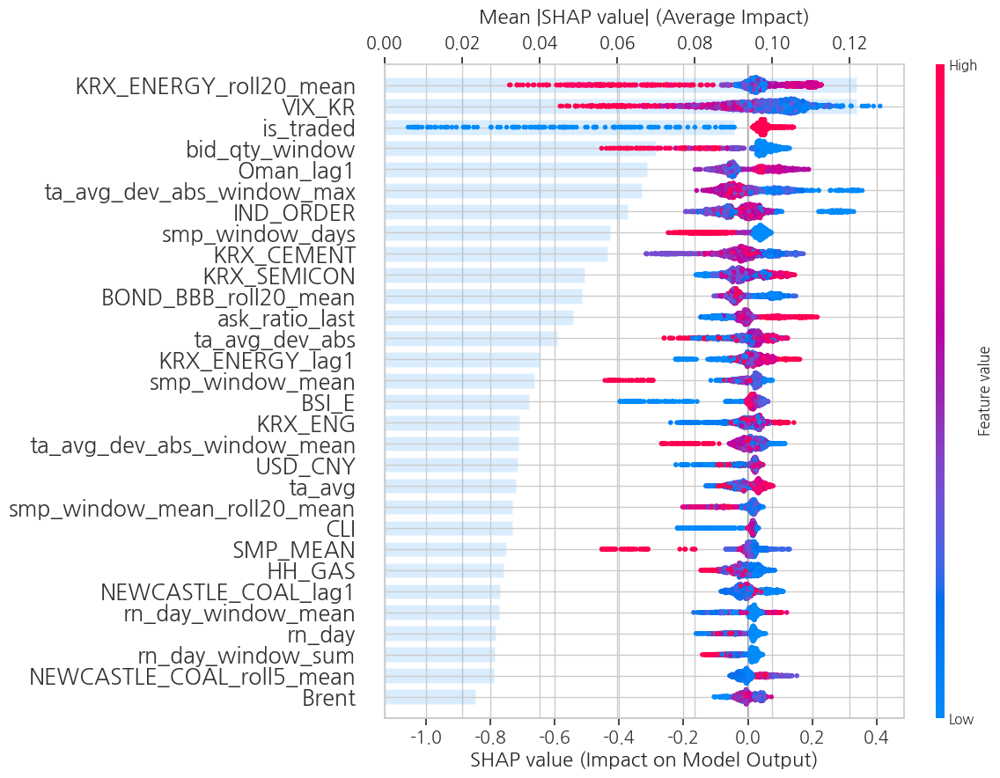

Test Dataset: 2026-05-15 10:00:46.079836
Total Explanation (Beeswarm + Importance Bar)...


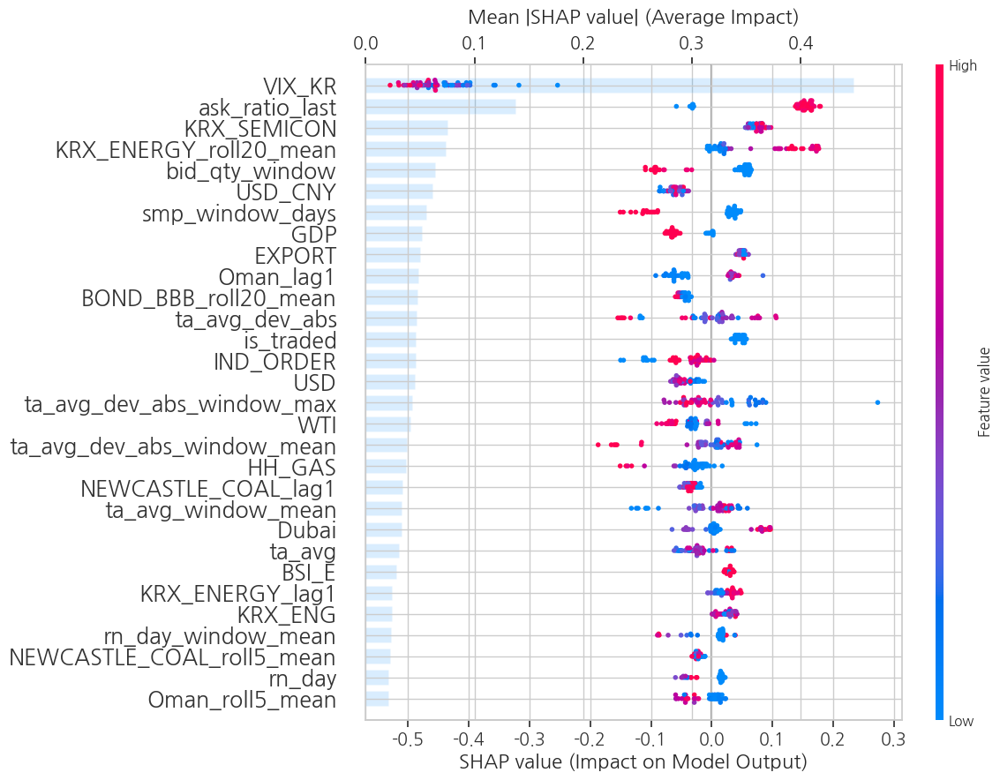

Test Dataset: 2026-05-15 10:00:46.605209
Feature Total Contribution...
Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 148.63it/s]


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,ask_ratio_last,0.1381,0.1906,0.9674,0.2040,0.0000,+,+,+,VIX_KR,0.4485,0.4485,-0.6597,-0.1532,-0.2004,-,-,-
1,KRX_SEMICON,0.0750,0.0750,0.6161,0.0232,0.0554,+,+,+,bid_qty_window,0.0635,0.1383,-0.9880,-0.6779,-0.6779,-,-,-
2,KRX_ENERGY_roll20_mean,0.0735,0.0851,0.9237,0.5471,0.7444,+,+,+,smp_window_days,0.0554,0.1467,-0.9516,-0.3480,-0.3480,-,-,-
3,USD_CNY,0.0616,0.0616,0.3555,0.0522,0.0981,+,+,+,GDP,0.0518,0.0585,-0.9812,-0.3209,-0.3209,-,-,-
4,Oman_lag1,0.0484,0.0939,0.8048,0.1271,0.0100,+,+,+,EXPORT,0.0498,0.0498,-0.3902,-0.0361,-0.0610,-,-,-


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,ask_ratio_last,0.1381,0.1906,0.9674,0.2040,0.0000,+,+,+,bid_qty_window,0.0635,0.1383,-0.9880,-0.6779,-0.6779,-,-,-
1,KRX_ENERGY_roll20_mean,0.0735,0.0851,0.9237,0.5471,0.7444,+,+,+,GDP,0.0518,0.0585,-0.9812,-0.3209,-0.3209,-,-,-
2,Oman_lag1,0.0484,0.0939,0.8048,0.1271,0.0100,+,+,+,IIP_CHEM,0.0099,0.0201,-0.9624,-0.0772,-0.0086,-,-,-
3,KRX_ENERGY_lag1,0.0240,0.0298,0.7871,0.0810,-0.0636,+,+,-,smp_window_days,0.0554,0.1467,-0.9516,-0.3480,-0.3480,-,-,-
4,PPI,0.0155,0.0155,0.7428,0.1015,-0.0008,+,+,-,weather_window_days,0.0177,0.0463,-0.9451,-0.1110,-0.1110,-,-,-


Interaction SHAP Calculation...: 2026-05-15 10:00:47.226023
SHAP intervalues saved to /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Model/shap_intervalues_XGBoost_20260515_100142.pkl
Test Dataset Interaction: 2026-05-15 10:01:42.583152
Feature Interactive Contribution...


Calculating Interactions: 100%|██████████| 80/80 [00:00<00:00, 1056.96it/s]


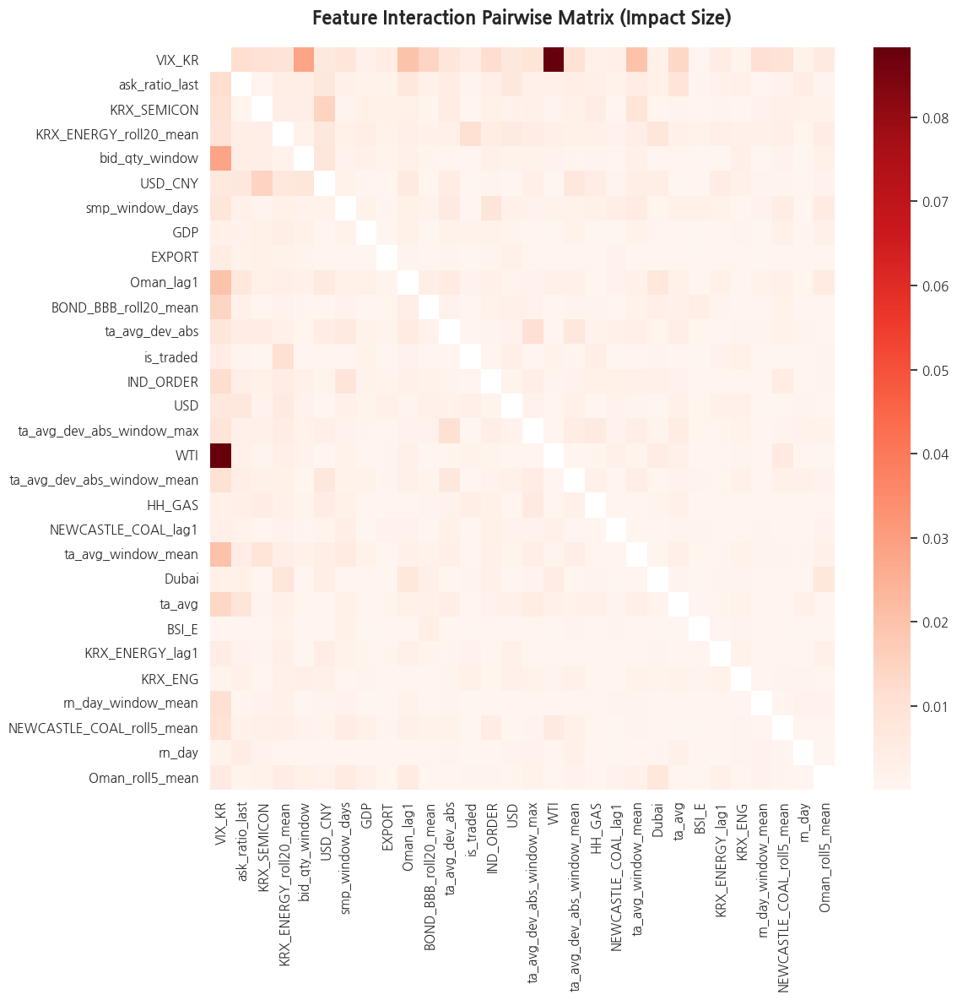

Calculating Correlations: 100%|██████████| 80/80 [00:00<00:00, 630.78it/s]


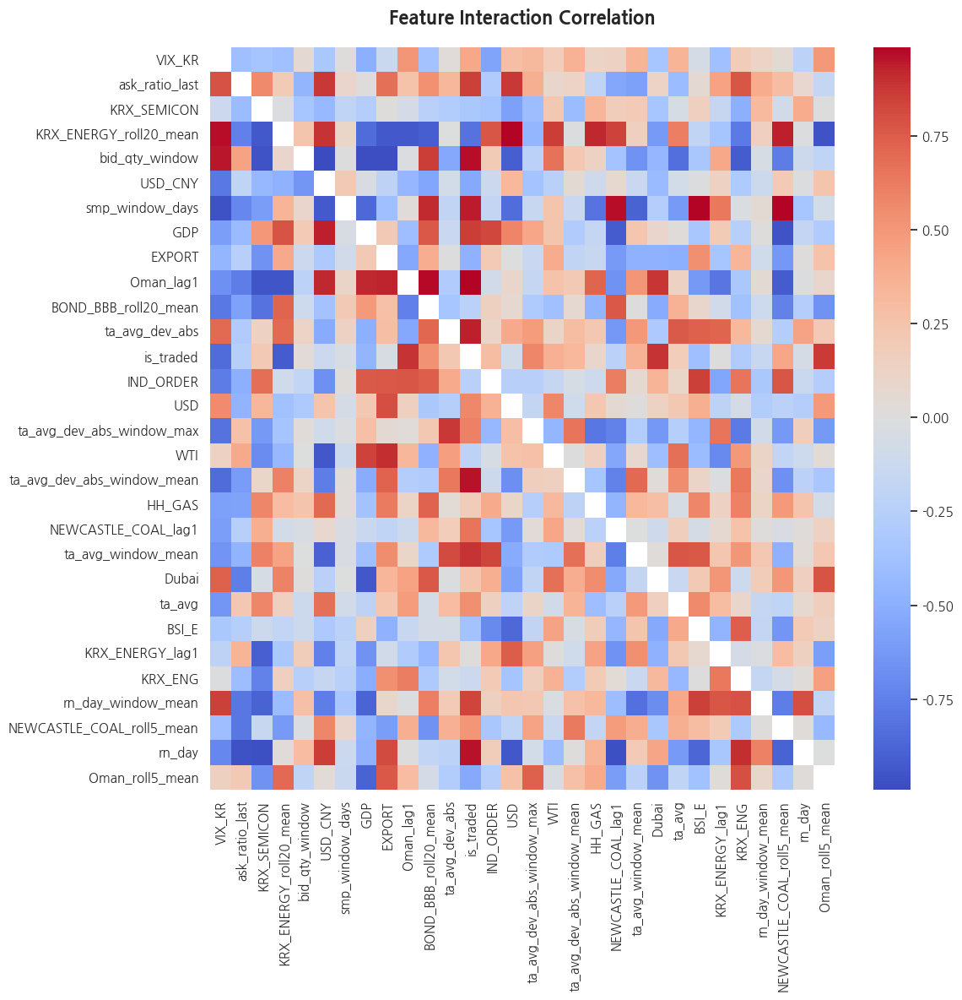


Test Dataset Sensitivity Analysis: 2026-05-15 10:01:43.951810
Sensitivity Analysis (ICE & PDP Plot) for Top 30 Features...


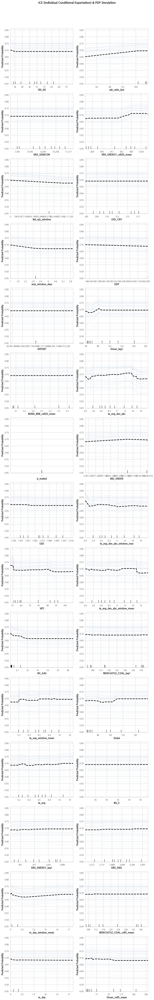

Train Dataset: 2026-05-15 10:01:49.071178
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 766


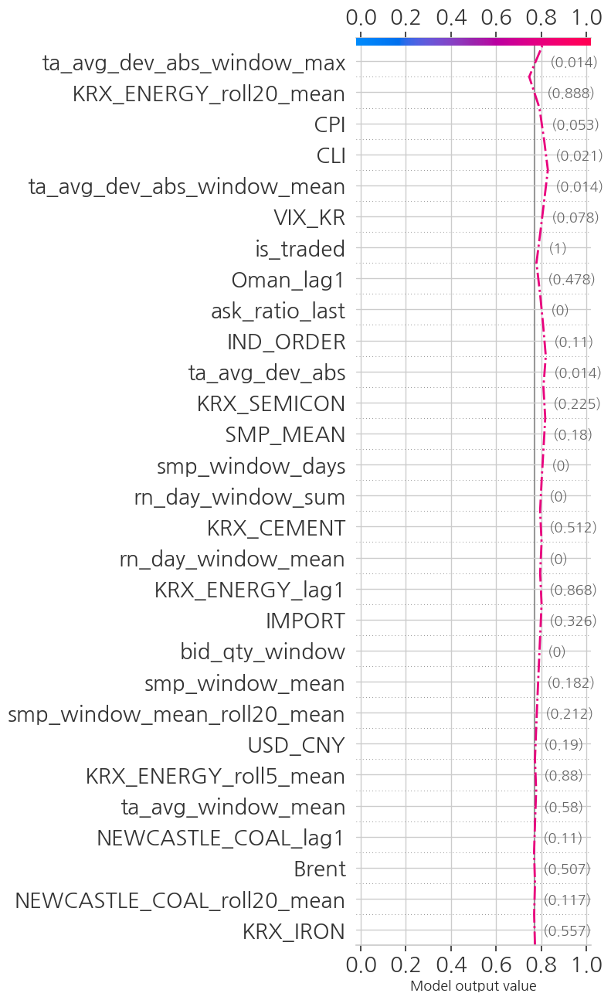

Test Dataset: 2026-05-15 10:01:49.470307
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 10


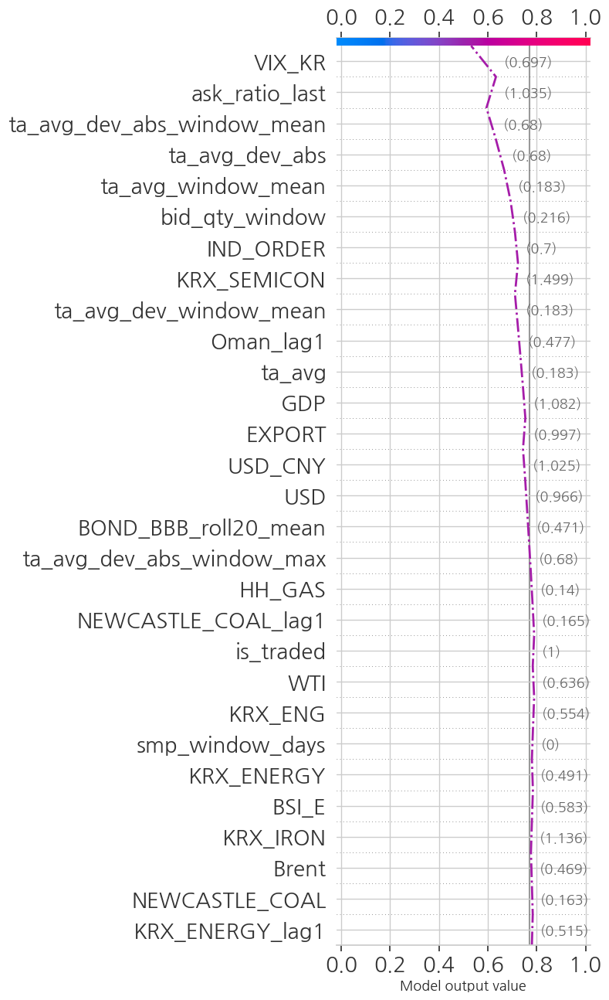

Performance Evaluations...:  2026-05-15 10:01:49.853875
Performance: 


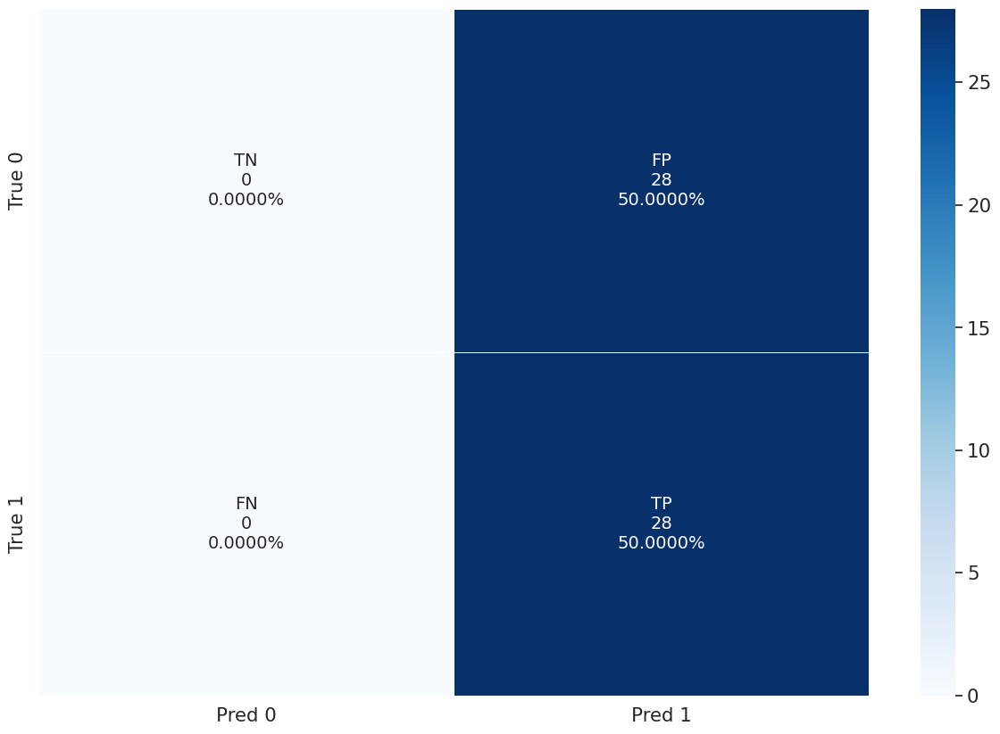

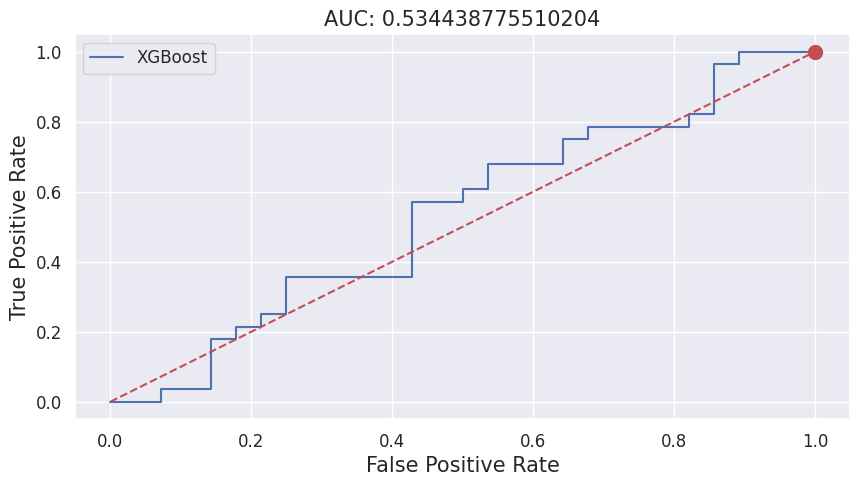

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,XGBoost,Train set,1510,754,212,543,1,0.5813,0.9987,0.2808,0.7349,0.6397,0.6397,0.9187
1,XGBoost,Test set,56,28,0,28,0,0.5000,1.0000,0.0000,0.6667,0.5000,0.5000,0.5344
2,XGBoost,Entire population,1566,782,212,571,1,0.5780,0.9987,0.2708,0.7322,0.6347,0.6347,0.9090



   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,XGBoost,Train set,1510,754,212,543,1,0.581342,0.998675,0.280795,0.734893,0.639735,0.639735,0.918700


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,XGBoost,Test set,56,28,0,28,0,0.500000,1.000000,0.000000,0.666667,0.500000,0.500000,0.534439


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,XGBoost,Entire population,1566,782,212,571,1,0.577975,0.998723,0.270754,0.732210,0.634738,0.634738,0.908982


In [18]:
# Setting
algorithm_list = [best_algo]
params = best_params
TUNE_TRIALS = None
# df_domain_rename = pd.read_excel(os.path.join(FOLDER_GDM, '[Rename_20251228].xlsx'), sheet_name='Features_SI')
# df_domain_rename = {i[0]:i[1] for i in df_domain_rename[['변수설명(한글)', '변수설명(영어)']].values}
# if LANGUAGE == 'kr':
#     X_selected = [col for col in X_colname if col in list(df_domain_rename.keys())]
# else:
#     X_selected = [df_rename[col] for col in X_colname if col in list(df_domain_rename.keys())]

# ML 실행
results_SHAP, scores_SHAP = modeling_ML(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname, 
    scaler_dict=scaler,
    params=params, # 특정 알고리즘
    tune_trials=TUNE_TRIALS, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC,
    shap=SHAP, 
    X_selected=None, # shap에서만 작동
    interaction=INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    X_top_display=X_TOP_DISPLAY-20, 
    label_list=LABEL_LIST,
)

# Group Analysis

In [32]:
np.unique(X_train[:,69])

array([0., 1.])


★★★ Subgroup Performance (Fairness) Evaluation: [phase] ★★★


,Subgroup Target,Group Name,N,Precision,Recall,Specificity,F1-score,Accuracy,AUC
0,phase,Phase4,56,0.5000,1.0000,0.0000,0.6667,0.5000,0.5344



★★★ Subgroup Analysis Pipeline: 기준 변수 [phase] ★★★
▶ Loading existing SHAP values: ./Model/shap_values_XGBoost_20260515_100045.pkl



################################################################################
🚀 실행 중인 데이터셋: [ Train Set ]
################################################################################

------------------------------------------------------------
### [Train Total] - Full Sample Rank & Direction Calculation ###
------------------------------------------------------------
Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 115.25it/s]



------------------------------------------------------------
### [phase] - Phase2 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 572명

[Phase2] 1. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Bar)...


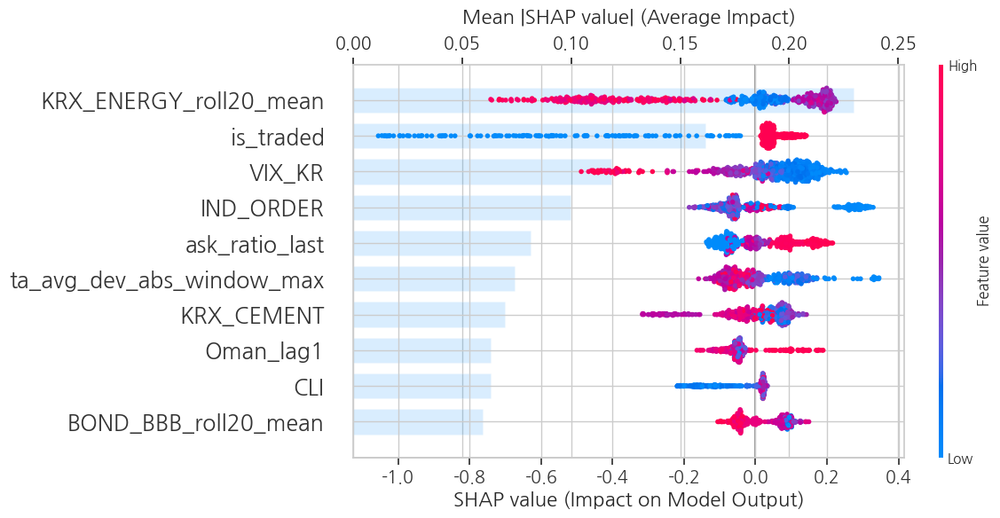

Feature Total Contribution...
Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 114.76it/s]


Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 116.18it/s]



------------------------------------------------------------
### [phase] - Phase3 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 938명

[Phase3] 1. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Bar)...


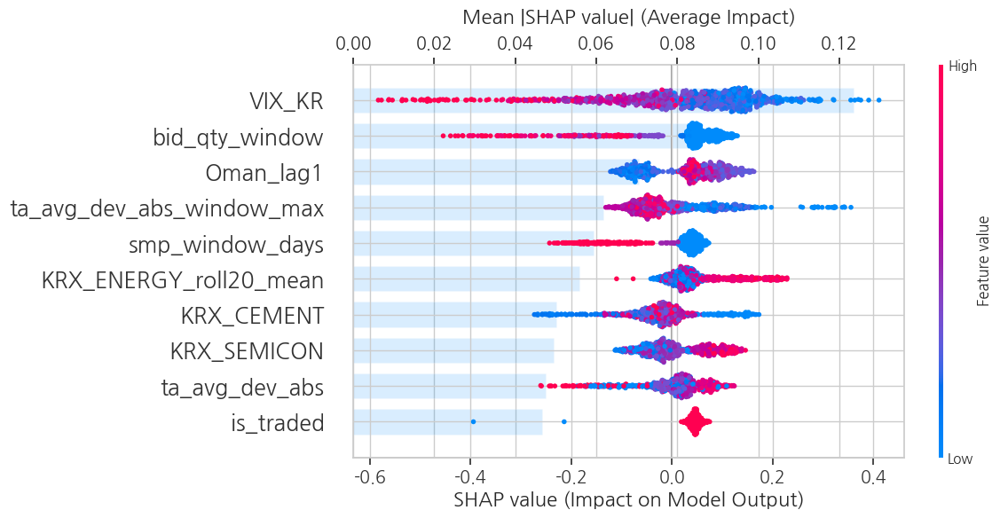

Feature Total Contribution...
Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 105.43it/s]


Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 104.08it/s]


------------------------------------------------------------
### [phase] - Phase4 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 0명

### Group Rank & Direction Master Table (Train Set, Split by: phase) ###


,Feature,Rank_Total,DirectionQR_Total,DirectionCORR_Total,Rank_Phase2,DirectionQR_Phase2,DirectionCORR_Phase2,Rank_Phase3,DirectionQR_Phase3,DirectionCORR_Phase3
0,KRX_ENERGY_roll20_mean,1,-,-,1,+,-,6,+,+
1,VIX_KR,2,-,-,3,-,-,1,-,-
2,is_traded,3,+,+,2,+,+,10,+,+
3,bid_qty_window,4,-,-,13,-,-,2,-,-
4,Oman_lag1,5,-,+,8,-,+,3,-,+
5,ta_avg_dev_abs_window_max,6,-,-,6,-,-,4,-,-
6,IND_ORDER,7,-,-,4,-,-,14,-,+
7,smp_window_days,8,-,-,11,-,-,5,-,-
8,KRX_CEMENT,9,-,-,7,+,-,7,+,-
9,KRX_SEMICON,10,-,+,12,+,+,8,+,+



💡 [phase] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Train Set)

▶ Correlation (CORR) 기준 엇갈리는 변수 (23개):
  - KRX_ENERGY_roll20_mean
  - IND_ORDER
  - smp_window_mean
  - USD_CNY
  - CLI
  - SMP_MEAN
  - NEWCASTLE_COAL_lag1
  - rn_day_window_mean
  - NEWCASTLE_COAL_roll5_mean
  - Brent
  - KRX_ENERGY_roll5_mean
  - USD
  - Oman_roll5_mean
  - CPI
  - Oman
  - Oman_roll20_mean
  - GDP
  - CCI
  - PPI
  - BSI_P
  - auction_window7
  - FV_KAU19
  - ask_ratio_last_known
▶ Quantile Regression (QR) 기준 엇갈리는 변수 (22개):
  - KRX_ENERGY_lag1
  - smp_window_mean
  - KRX_ENG
  - ta_avg
  - smp_window_mean_roll20_mean
  - SMP_MEAN
  - ta_avg_window_mean
  - KRX_ENERGY_roll5_mean
  - Dubai
  - KOSPI
  - smp_window_mean_lag1
  - WTI
  - IMPORT
  - NEWCASTLE_COAL_roll20_mean
  - Oman
  - Oman_roll20_mean
  - CCI
  - IIP_CHEM
  - auction_window7
  - FV_KAU22
  - CALL
  - FV_KAU24

마스터 테이블이 저장되었습니다: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/FeatureImportance_MasterTable_Train_XGBoost_phase.csv



##########

100%|██████████| 80/80 [00:00<00:00, 126.70it/s]



------------------------------------------------------------
### [phase] - Phase2 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 0명

------------------------------------------------------------
### [phase] - Phase3 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 0명

------------------------------------------------------------
### [phase] - Phase4 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 56명

[Phase4] 1. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Bar)...


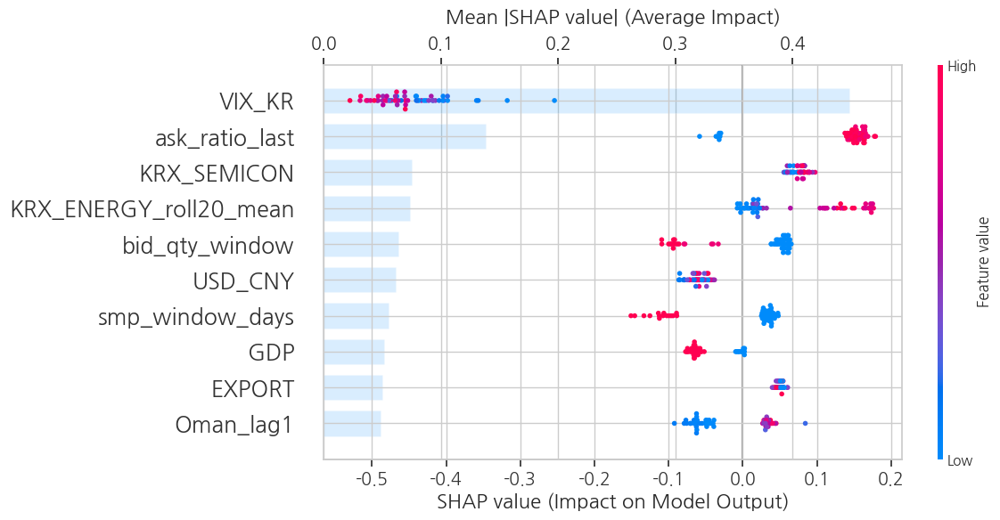

Feature Total Contribution...
Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 122.84it/s]


Feature Contribution Direction...


100%|██████████| 80/80 [00:00<00:00, 123.60it/s]


### Group Rank & Direction Master Table (Test Set, Split by: phase) ###


,Feature,Rank_Total,DirectionQR_Total,DirectionCORR_Total,Rank_Phase4,DirectionQR_Phase4,DirectionCORR_Phase4
0,VIX_KR,1,-,-,1,-,-
1,ask_ratio_last,2,+,+,2,+,+
2,KRX_SEMICON,3,+,+,3,+,+
3,KRX_ENERGY_roll20_mean,4,+,+,4,+,+
4,bid_qty_window,5,-,-,5,-,-
5,USD_CNY,6,+,+,6,+,+
6,smp_window_days,7,-,-,7,-,-
7,GDP,8,-,-,8,-,-
8,EXPORT,9,-,-,9,-,-
9,Oman_lag1,10,+,+,10,+,+



💡 [phase] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Test Set)

▶ Correlation (CORR) 기준 엇갈리는 변수 (0개):
▶ Quantile Regression (QR) 기준 엇갈리는 변수 (0개):

마스터 테이블이 저장되었습니다: /mnt/c/DataScience/[DIVE]/Project/CO2XAI/Result/FeatureImportance_MasterTable_Test_XGBoost_phase.csv

🎉 Train 및 Test 데이터셋에 대한 Subgroup Analysis가 모두 완료되었습니다.


In [41]:
# 연가구소득
target_group = 'phase'
groups = {'Phase2': 0, 'Phase3': 1, 'Phase4':2}
# key_features = [
#     'Felt unable to carry on/do anything',
#     'Satisfaction with family life',
#     'Family life causes me stress',
#     'Energy bill discount/subsidy (electricity, gas, etc.)', # 또는 'Energy bill discount/subsidy'
#     'Felt lonely',
#     'Everything felt difficult',
#     'Satisfaction with relationship with children',
#     'Satisfaction with job'
# ]
key_features=None

df_fairness = evaluation_class_GroupFairness(
    best_model=best_model,
    target_col=target_group,
    groups_dict=groups,
    X_test=X_test, Y_test=Y_test, X_colname=X_colname
)

df_comparison = explanation_SHAP_groupcomparing(
    target_col=target_group,
    groups_dict=groups,
    X_train=X_train, X_test=X_test,
    X_colname=X_colname,
    best_algo=best_algo,
    max_display=10,
    save_csv=True,
    target_features=key_features
)